<a href="https://colab.research.google.com/github/samirp92/Final-Year-Project-Time-Series-Forecasting-/blob/LSTM/LSTM_univariate_vs_multivariate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import the required libraries

In [3]:
# Disable warnings in the notebook for maintaining clean output
import warnings
warnings.filterwarnings('ignore')

# Import the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from keras.models import Sequential
from keras.layers import LSTM, Dropout, Dense
from keras.callbacks import EarlyStopping, ModelCheckpoint
#from scikeras.wrappers import KerasRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import tensorflow as tf
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [4]:
# Mount the google drive
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

# Set the root path directory
root_path = "/content/drive/MyDrive/Final Year Project"

Mounted at /content/drive


# Data Loading

In [5]:
# Load the data from google drive
df = pd.read_csv("/content/drive/MyDrive/Final Year Project/household_power_consumption.txt", sep=';')
df

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,16/12/2006,17:24:00,4.216,0.418,234.840,18.400,0.000,1.000,17.0
1,16/12/2006,17:25:00,5.360,0.436,233.630,23.000,0.000,1.000,16.0
2,16/12/2006,17:26:00,5.374,0.498,233.290,23.000,0.000,2.000,17.0
3,16/12/2006,17:27:00,5.388,0.502,233.740,23.000,0.000,1.000,17.0
4,16/12/2006,17:28:00,3.666,0.528,235.680,15.800,0.000,1.000,17.0
...,...,...,...,...,...,...,...,...,...
2075254,26/11/2010,20:58:00,0.946,0.0,240.43,4.0,0.0,0.0,0.0
2075255,26/11/2010,20:59:00,0.944,0.0,240.0,4.0,0.0,0.0,0.0
2075256,26/11/2010,21:00:00,0.938,0.0,239.82,3.8,0.0,0.0,0.0
2075257,26/11/2010,21:01:00,0.934,0.0,239.7,3.8,0.0,0.0,0.0


# Data Preprocessing

In [6]:
# Replace '?' with NaN values
df.replace('?', np.nan, inplace=True)

In [7]:
# Convert numeric columns to appropriate data types
df['Global_active_power'] = pd.to_numeric(df['Global_active_power'], errors='coerce')
df['Global_reactive_power'] = pd.to_numeric(df['Global_reactive_power'], errors='coerce')
df['Voltage'] = pd.to_numeric(df['Voltage'], errors='coerce')
df['Global_intensity'] = pd.to_numeric(df['Global_intensity'], errors='coerce')
df['Sub_metering_1'] = pd.to_numeric(df['Sub_metering_1'], errors='coerce')
df['Sub_metering_2'] = pd.to_numeric(df['Sub_metering_2'], errors='coerce')

# Confirm the updated data types
print(df.dtypes)

Date                      object
Time                      object
Global_active_power      float64
Global_reactive_power    float64
Voltage                  float64
Global_intensity         float64
Sub_metering_1           float64
Sub_metering_2           float64
Sub_metering_3           float64
dtype: object


In [8]:
# Check Missing Values
df.isnull().sum()

,0
Date,0
Time,0
Global_active_power,25979
Global_reactive_power,25979
Voltage,25979
Global_intensity,25979
Sub_metering_1,25979
Sub_metering_2,25979
Sub_metering_3,25979


In [9]:
# Convert the 'Date' and 'Time' columns to a single 'date_time' column
df['date_time'] = pd.to_datetime(df['Date'] + ' ' + df['Time'])

# Convert the 'date_time' column to datetime format
df['date_time'] = pd.to_datetime(df['date_time'])

# Set the 'date_time' column as the index
df.set_index('date_time', inplace=True)

# Drop the original 'Date' and 'Time' columns
df.drop(columns=['Date', 'Time'], inplace=True)

# Copy the original DataFrame into a new DataFrame
df_copy = df.copy()
df_copy

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
date_time,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0
2006-12-16 17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0
2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0
2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0
2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0
...,...,...,...,...,...,...,...
2010-11-26 20:58:00,0.946,0.000,240.43,4.0,0.0,0.0,0.0
2010-11-26 20:59:00,0.944,0.000,240.00,4.0,0.0,0.0,0.0
2010-11-26 21:00:00,0.938,0.000,239.82,3.8,0.0,0.0,0.0


# Data Imputation

In [10]:
# Check Missing Values
df.isnull().sum()

,0
Global_active_power,25979
Global_reactive_power,25979
Voltage,25979
Global_intensity,25979
Sub_metering_1,25979
Sub_metering_2,25979
Sub_metering_3,25979


In [11]:
# Apply MICE imputer
imputer = IterativeImputer(random_state=0)
df_imputed = imputer.fit_transform(df)

# Convert back to DataFrame
df_imputed = pd.DataFrame(df_imputed, index=df.index, columns=df.columns)

# Save the DataFrame to an Excel file
df_imputed.to_csv('df_imputed.csv')

In [12]:
# Check Missing Values after imputation
df_imputed.isnull().sum()

,0
Global_active_power,0
Global_reactive_power,0
Voltage,0
Global_intensity,0
Sub_metering_1,0
Sub_metering_2,0
Sub_metering_3,0


Note:-

(Global_active_power*1000/60 - Sub_metering_1 - Sub_metering_2 - Sub_metering_3) represents the active energy consumed every minute (in watt hour) in the household by electrical equipment not measured in sub-meterings 1, 2 and 3

In [13]:
# Creating new variable for remaining power consumption in watt hour
equation1 = (df_imputed['Global_active_power']*1000/60)
equation2 = df_imputed['Sub_metering_1'] + df_imputed['Sub_metering_2'] + df_imputed['Sub_metering_3']
df_imputed['Sub_metering_4'] = equation1 - equation2
df_imputed

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Sub_metering_4
date_time,,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0,52.266667
2006-12-16 17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0,72.333333
2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0,70.566667
2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0,71.800000
2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0,43.100000
...,...,...,...,...,...,...,...,...
2010-11-26 20:58:00,0.946,0.000,240.43,4.0,0.0,0.0,0.0,15.766667
2010-11-26 20:59:00,0.944,0.000,240.00,4.0,0.0,0.0,0.0,15.733333
2010-11-26 21:00:00,0.938,0.000,239.82,3.8,0.0,0.0,0.0,15.633333


# Univariate for hourly resampled data

## Hourly resampled data

In [14]:
# Resampled the data
hourly_resampled = df_imputed.resample('H').mean()

In [15]:
# Select the 'Global_active_power' column from the DataFrame
df1 = hourly_resampled['Global_active_power']
df1

,Global_active_power
date_time,
2006-12-16 17:00:00,4.222889
2006-12-16 18:00:00,3.632200
2006-12-16 19:00:00,3.400233
2006-12-16 20:00:00,3.268567
2006-12-16 21:00:00,3.056467
...,...
2010-11-26 17:00:00,1.725900
2010-11-26 18:00:00,1.573467
2010-11-26 19:00:00,1.659333


## Data Normalization

In [16]:
# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))

# Scale the data
scaled_df1 = scaler.fit_transform(df1.values.reshape(-1, 1))

# Shape of scaled data
scaled_df1

array([[0.63681623],
       [0.54504495],
       [0.50900588],
       ...,
       [0.2385342 ],
       [0.16153105],
       [0.12594772]])

## LSTM-1 Adam(lr=0.001) seq=24 epochs=50 batch_size=32

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 100)                 │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 40,901 (159.77 KB)

 Trainable params: 40,901 (159.77 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
865/865 - 10s - 11ms/step - loss: 0.0129 - val_loss: 0.0089
Epoch 2/50
865/865 - 5s - 6ms/step - loss: 0.0100 - val_loss: 0.0082
Epoch 3/50
865/865 - 4s - 4ms/step - loss: 0.0094 - val_loss: 0.0069
Epoch 4/50
865/865 - 8s - 9ms/step - loss: 0.0091 - val_loss: 0.0074
Epoch 5/50
865/865 - 6s - 7ms/step - loss: 0.0089 - val_loss: 0.0072
Epoch 6/50
865/865 - 6s - 7ms/step - loss: 0.0088 - val_loss: 0.0071
Epoch 7/50
865/865 - 5s - 5ms/step - loss: 0.0088 - val_loss: 0.0072
Epoch 8/50
865/865 - 3s - 4ms/step - loss: 0.0087 - val_loss: 0.0071
Epoch 9/50
865/865 - 3s - 4ms/step - loss: 0.0087 - val_loss: 0.0071
Epoch 10/50
865/865 - 5s - 6ms/step - loss: 0.0086 - val_loss: 0.0070
Epoch 11/50
865/865 - 4s - 4ms/step - loss: 0.0087 - val_loss: 0.0070
Epoch 12/50
865/865 - 5s - 6ms/step - loss: 0.0086 - val_loss: 0.0072
Epoch 13/50
865/865 - 5s - 5ms/step - loss: 0.0086 - val_loss: 0.0069
Epoch 14/50
865/865 - 5s - 5ms/step - loss: 0.0086 - val_loss: 0.0071
Epoch 15/50
865/865 - 5s - 

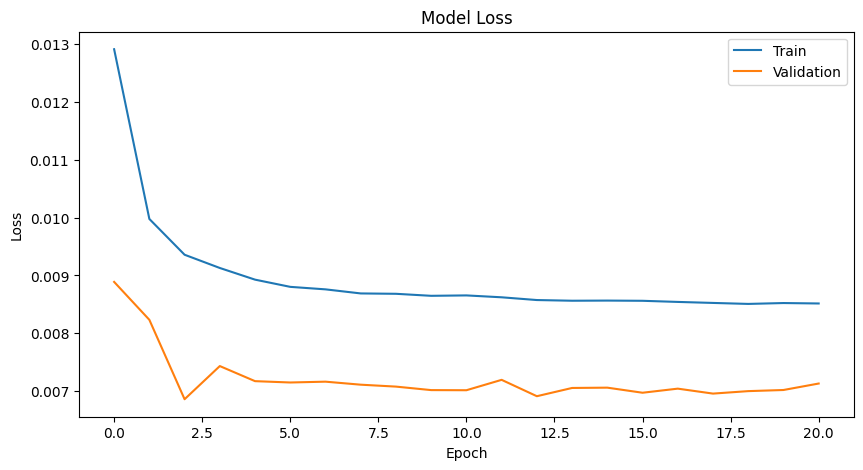

865/865 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
217/217 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

Train MAE: 0.457
Train MSE: 0.388
Train RMSE: 0.623
Train R² score: 0.549

Test MAE: 0.404
Test MSE: 0.295
Test RMSE: 0.543
Test R² score: 0.436


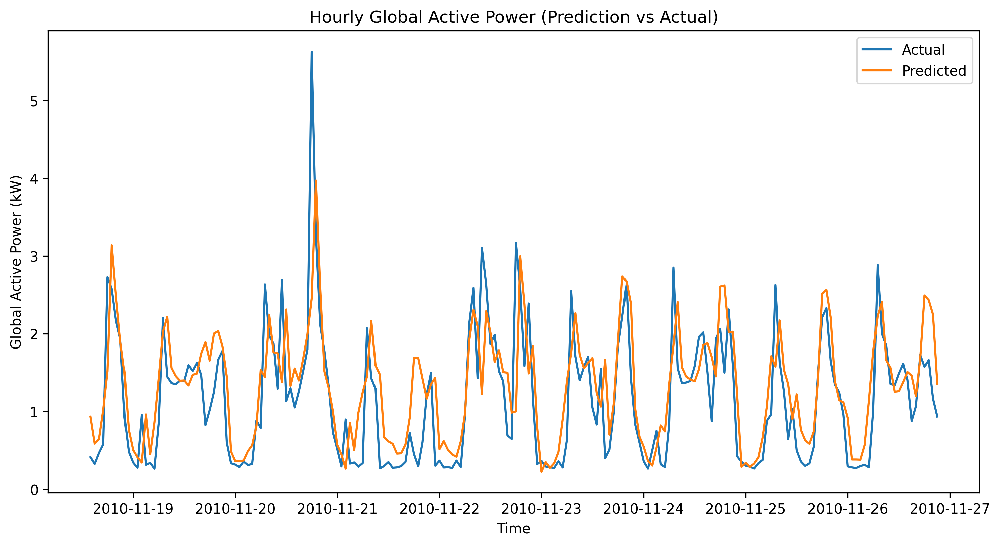

In [17]:
# Define sequence length and features
sequence_length = 24             # Number of time steps to consider in each sequence
num_features = 1                 # Number of features

# Create sequences and corresponding labels
sequences = []
labels = []
for i in range(len(scaled_df1) - sequence_length):
    seq = scaled_df1[i:i+sequence_length]
    label = scaled_df1[i+sequence_length][0]  # 'Global_Active_Power' column index
    sequences.append(seq)
    labels.append(label)

# Convert to numpy arrays
sequences = np.array(sequences)
labels = np.array(labels)

# Split into train and test sets
train_size = int(0.8 * len(sequences))
X_train, X_test = sequences[:train_size], sequences[train_size:]
y_train, y_test = labels[:train_size], labels[train_size:]

# Check the shape of Train & Test Split
X_train.shape, y_train.shape, X_test.shape, y_test.shape

# Create the LSTM model
model = Sequential()
model.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(1))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Displaying a summary of the model
model.summary()

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=20 , min_delta=0.005)

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test),
                    verbose=2, shuffle=False, callbacks=[early_stopping])

# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Predict train and test data using the trained model
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Perform inverse transformation to rescale back to original range
# y_true values for train data
y_train_copies = np.repeat(y_train.reshape(-1, 1), X_train.shape[-1], axis=-1)
true_y_train = scaler.inverse_transform(y_train_copies)[:,0]

# predicted values for train data
train_prediction_copies = np.repeat(train_predict, df1.shape[-1], axis=-1)
pred_y_train = scaler.inverse_transform(train_prediction_copies)[:,0]

# y_true values for test data
y_test_copies = np.repeat(y_test.reshape(-1, 1), X_test.shape[-1], axis=-1)
true_y_test = scaler.inverse_transform(y_test_copies)[:,0]

# predicted values for test data
test_prediction_copies = np.repeat(test_predict, df1.shape[-1], axis=-1)
pred_y_test = scaler.inverse_transform(test_prediction_copies)[:,0]

# Calculate evaluation metrics
print(f'\nTrain MAE: {mean_absolute_error(true_y_train, pred_y_train):.3f}')
print(f'Train MSE: {mean_squared_error(true_y_train, pred_y_train):.3f}')
print(f'Train RMSE: {np.sqrt(mean_squared_error(true_y_train, pred_y_train)):.3f}')
print(f'Train R² score: {r2_score(true_y_train, pred_y_train):.3f}')

print(f'\nTest MAE: {mean_absolute_error(true_y_test, pred_y_test):.3f}')
print(f'Test MSE: {mean_squared_error(true_y_test, pred_y_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(true_y_test, pred_y_test)):.3f}')
print(f'Test R² score: {r2_score(true_y_test, pred_y_test):.3f}')

# Plotting predicted and actual temperatures
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df1.index[-200:], true_y_test[-200:], label='Actual')
plt.plot(df1.index[-200:], pred_y_test[-200:], label='Predicted')
plt.title('Hourly Global Active Power (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.show()

# Multivariate-1 for for hourly resampled data

In [18]:
# Resampled the data
hourly_resampled = df_imputed.resample('H').mean()

## EDA

In [19]:
# Define a function to plot the visualization, distribution and correlation of resampled data
def df_visu_dist_corr(dataset, resample_type, title):

  # Resample the data
  df_resampled = dataset.resample(resample_type).mean()

  print('Shape after %s resampling of data : %s ' %(title, df_resampled.shape))

  # Plot Resampled Data set
  df_resampled.plot(subplots=True, figsize=(30,20))
  plt.suptitle("Visualization of %s resampled Data" %title, fontsize=30, color='blue')
  plt.tight_layout(rect=[0, 0, 1, 0.96])
  plt.show()

  # Plot distribution
  print(' \n\n************************************************ %s Resampled distribution Plot **************************************************' %title, end="\n\n")
  df_resampled.hist(figsize=(15, 10), bins=50)
  plt.tight_layout(rect=[0, 0, 1, 0.96])
  plt.gcf().set_dpi(300)
  plt.show()

  # Plot correlation plot
  print(' \n\n************************************************ Correlation Plot for %s Resampled Data **************************************************' %title, end="\n\n")
  plt.figure(figsize=(10,6))
  sns.heatmap(df_resampled.corr(), annot=True, cmap='coolwarm', fmt='.2f')
  plt.tight_layout(rect=[0, 0, 1, 0.96])
  plt.gcf().set_dpi(200)
  plt.show()

Shape after Hourly resampling of data : (34589, 8) 


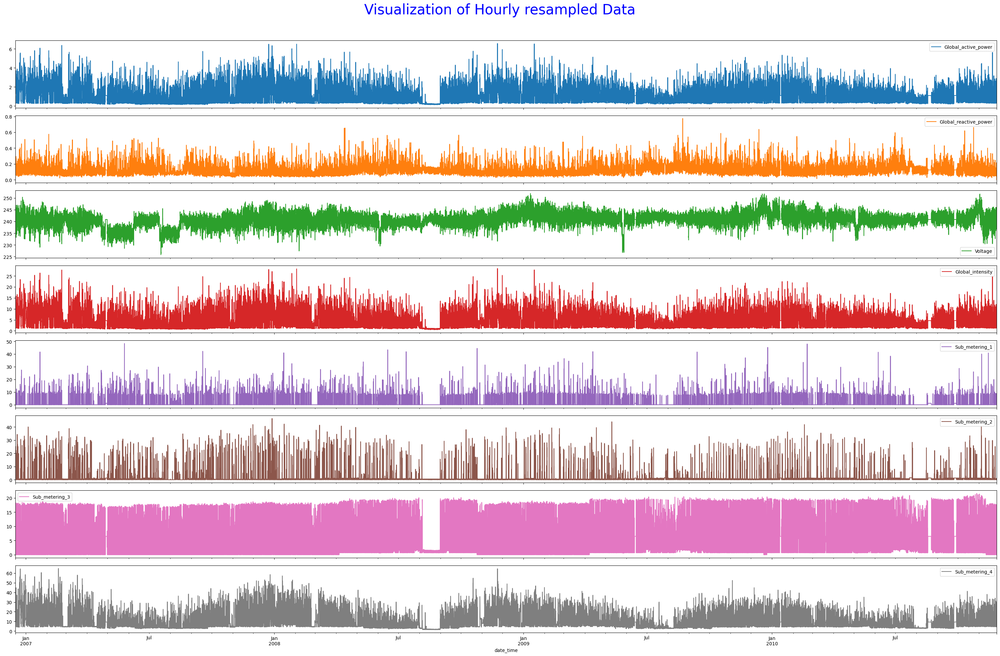

 

************************************************ Hourly Resampled distribution Plot **************************************************



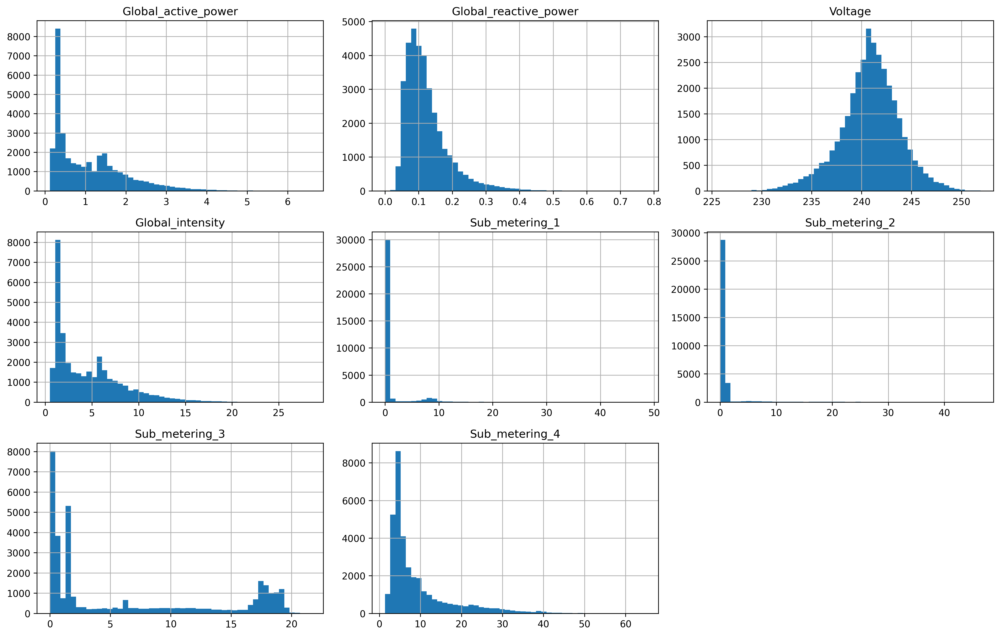

 

************************************************ Correlation Plot for Hourly Resampled Data **************************************************



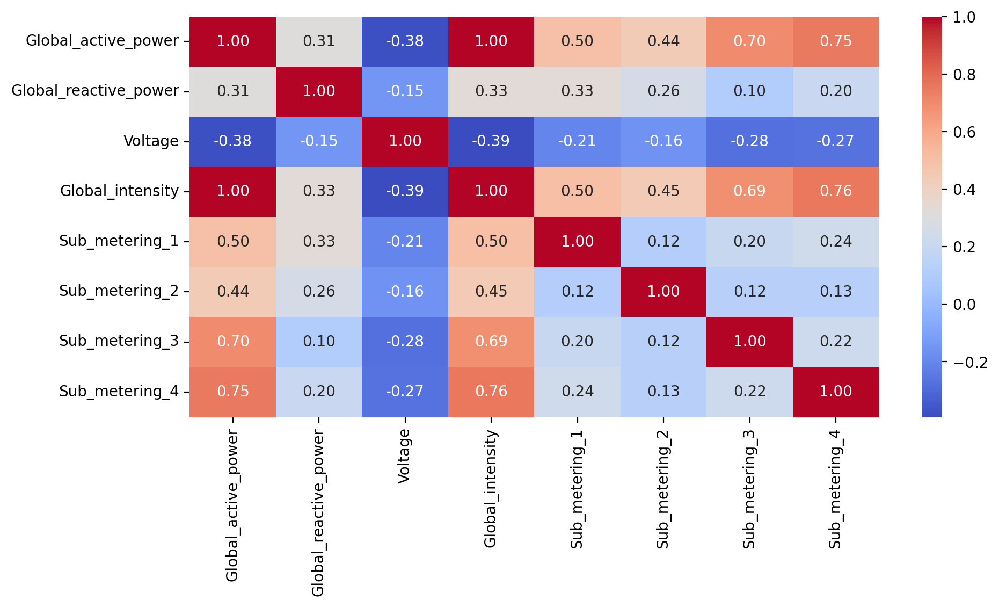

In [20]:
# Plot the visualization, distribution and correlation of Daily resampled data
df_visu_dist_corr(df_imputed, "H", "Hourly")

Note:- As Global_intensity and sub_metering_4 are highly correlated with Global_active_power so I am removing those columns

In [21]:
df2 = hourly_resampled.drop(['Global_intensity','Sub_metering_4'], axis=1)
df2

,Global_active_power,Global_reactive_power,Voltage,Sub_metering_1,Sub_metering_2,Sub_metering_3
date_time,,,,,,
2006-12-16 17:00:00,4.222889,0.229000,234.643889,0.0,0.527778,16.861111
2006-12-16 18:00:00,3.632200,0.080033,234.580167,0.0,6.716667,16.866667
2006-12-16 19:00:00,3.400233,0.085233,233.232500,0.0,1.433333,16.683333
2006-12-16 20:00:00,3.268567,0.075100,234.071500,0.0,0.000000,16.783333
2006-12-16 21:00:00,3.056467,0.076667,237.158667,0.0,0.416667,17.216667
...,...,...,...,...,...,...
2010-11-26 17:00:00,1.725900,0.061400,237.069667,0.0,0.000000,12.866667
2010-11-26 18:00:00,1.573467,0.053700,237.531833,0.0,0.000000,0.000000
2010-11-26 19:00:00,1.659333,0.060033,236.741000,0.0,0.066667,0.000000


## Data Normalization

In [22]:
# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))

# Scale the data
scaled_df2 = scaler.fit_transform(df2)

# Shape of scaled data
scaled_df2

array([[0.63681623, 0.29573827, 0.33794529, 0.        , 0.01136636,
        0.78241815],
       [0.54504495, 0.10335773, 0.33550078, 0.        , 0.14465183,
        0.78267595],
       [0.50900588, 0.11007318, 0.28380167, 0.        , 0.03086863,
        0.7741686 ],
       ...,
       [0.2385342 , 0.07752906, 0.41839455, 0.        , 0.00143575,
        0.        ],
       [0.16153105, 0.07899268, 0.52024552, 0.        , 0.022972  ,
        0.        ],
       [0.12594772, 0.        , 0.53152393, 0.        , 0.        ,
        0.        ]])

## LSTM-1 Adam(lr=0.001) seq=24 epochs=50 batch_size=32

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_1 (LSTM)                        │ (None, 100)                 │          42,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 42,901 (167.58 KB)

 Trainable params: 42,901 (167.58 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
865/865 - 5s - 6ms/step - loss: 0.0124 - val_loss: 0.0092
Epoch 2/50
865/865 - 6s - 7ms/step - loss: 0.0093 - val_loss: 0.0086
Epoch 3/50
865/865 - 4s - 5ms/step - loss: 0.0087 - val_loss: 0.0083
Epoch 4/50
865/865 - 5s - 5ms/step - loss: 0.0084 - val_loss: 0.0074
Epoch 5/50
865/865 - 6s - 7ms/step - loss: 0.0082 - val_loss: 0.0072
Epoch 6/50
865/865 - 4s - 5ms/step - loss: 0.0080 - val_loss: 0.0070
Epoch 7/50
865/865 - 4s - 4ms/step - loss: 0.0079 - val_loss: 0.0074
Epoch 8/50
865/865 - 4s - 4ms/step - loss: 0.0079 - val_loss: 0.0071
Epoch 9/50
865/865 - 5s - 6ms/step - loss: 0.0078 - val_loss: 0.0072
Epoch 10/50
865/865 - 5s - 5ms/step - loss: 0.0077 - val_loss: 0.0070
Epoch 11/50
865/865 - 6s - 7ms/step - loss: 0.0077 - val_loss: 0.0070
Epoch 12/50
865/865 - 4s - 5ms/step - loss: 0.0077 - val_loss: 0.0071
Epoch 13/50
865/865 - 4s - 4ms/step - loss: 0.0076 - val_loss: 0.0069
Epoch 14/50
865/865 - 6s - 7ms/step - loss: 0.0075 - val_loss: 0.0069
Epoch 15/50
865/865 - 4s - 5m

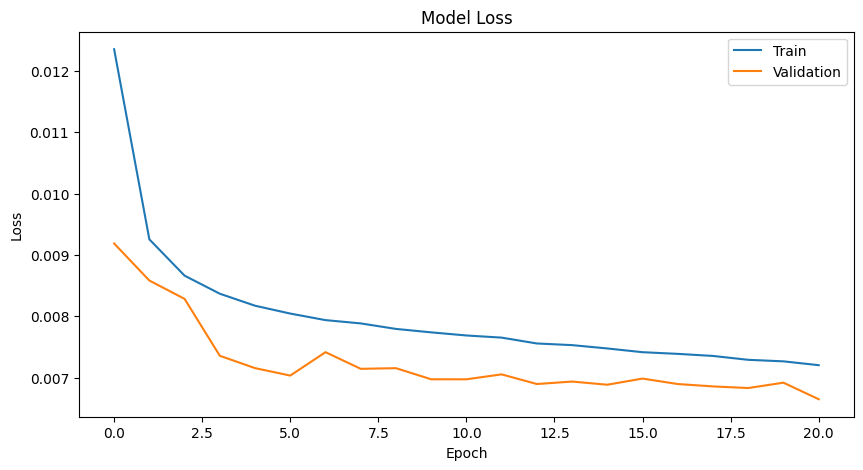

865/865 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
217/217 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

Train MAE: 0.442
Train MSE: 0.343
Train RMSE: 0.586
Train R² score: 0.601

Test MAE: 0.402
Test MSE: 0.275
Test RMSE: 0.525
Test R² score: 0.474


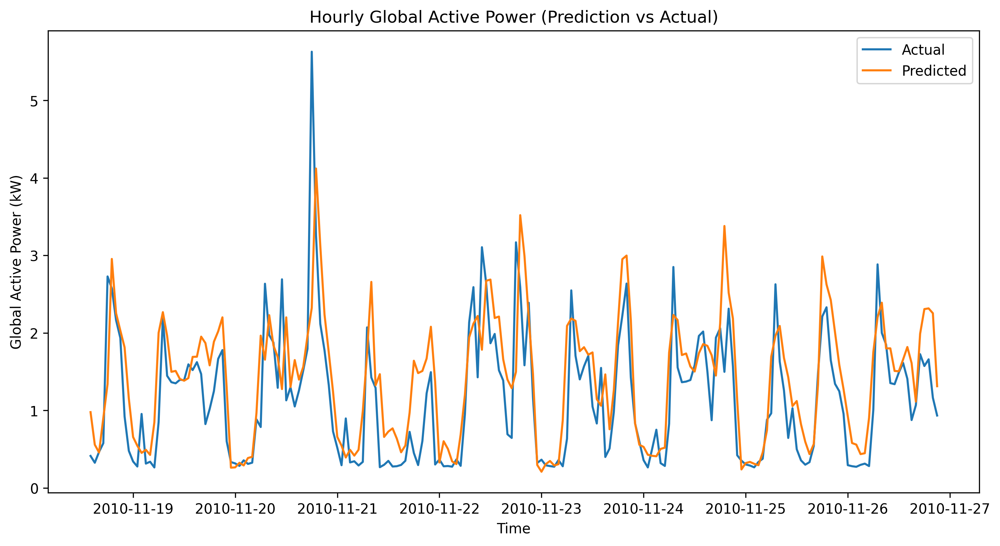

In [23]:
# Define sequence length and features
sequence_length = 24             # Number of time steps to consider in each sequence
num_features = len(df2.columns)  # Number of features

# Create sequences and corresponding labels
sequences = []
labels = []
for i in range(len(scaled_df2) - sequence_length):
    seq = scaled_df2[i:i+sequence_length]
    label = scaled_df2[i+sequence_length][0]  # 'Global_Active_Power' column index
    sequences.append(seq)
    labels.append(label)

# Convert to numpy arrays
sequences = np.array(sequences)
labels = np.array(labels)

# Split into train and test sets
train_size = int(0.8 * len(sequences))
X_train, X_test = sequences[:train_size], sequences[train_size:]
y_train, y_test = labels[:train_size], labels[train_size:]

# Check the shape of Train & Test Split
X_train.shape, y_train.shape, X_test.shape, y_test.shape

# Create the LSTM model
model = Sequential()
model.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(1))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Displaying a summary of the model
model.summary()

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=20 , min_delta=0.005)

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test),
                    verbose=2, shuffle=False, callbacks=[early_stopping])

# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Predict train and test data using the trained model
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Perform inverse transformation to rescale back to original range
# y_true values for train data
y_train_copies = np.repeat(y_train.reshape(-1, 1), X_train.shape[-1], axis=-1)
true_y_train = scaler.inverse_transform(y_train_copies)[:,0]

# predicted values for train data
train_prediction_copies = np.repeat(train_predict, df2.shape[-1], axis=-1)
pred_y_train = scaler.inverse_transform(train_prediction_copies)[:,0]

# y_true values for test data
y_test_copies = np.repeat(y_test.reshape(-1, 1), X_test.shape[-1], axis=-1)
true_y_test = scaler.inverse_transform(y_test_copies)[:,0]

# predicted values for test data
test_prediction_copies = np.repeat(test_predict, df2.shape[-1], axis=-1)
pred_y_test = scaler.inverse_transform(test_prediction_copies)[:,0]

# Calculate evaluation metrics
print(f'\nTrain MAE: {mean_absolute_error(true_y_train, pred_y_train):.3f}')
print(f'Train MSE: {mean_squared_error(true_y_train, pred_y_train):.3f}')
print(f'Train RMSE: {np.sqrt(mean_squared_error(true_y_train, pred_y_train)):.3f}')
print(f'Train R² score: {r2_score(true_y_train, pred_y_train):.3f}')

print(f'\nTest MAE: {mean_absolute_error(true_y_test, pred_y_test):.3f}')
print(f'Test MSE: {mean_squared_error(true_y_test, pred_y_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(true_y_test, pred_y_test)):.3f}')
print(f'Test R² score: {r2_score(true_y_test, pred_y_test):.3f}')

# Plotting predicted and actual temperatures
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df2.index[-200:], true_y_test[-200:], label='Actual')
plt.plot(df2.index[-200:], pred_y_test[-200:], label='Predicted')
plt.title('Hourly Global Active Power (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.show()

# Multivariate-2 for hourly resampled data

In [24]:
# hourly resampled data
hourly_resampled = df_imputed.resample('H').mean()

# Make new dataframe with Global active power column
df3 = hourly_resampled.drop(['Global_reactive_power', 'Voltage',	'Global_intensity',
                             'Sub_metering_1', 'Sub_metering_2','Sub_metering_3','Sub_metering_4'], axis=1)

## Feature Engineering

In [25]:
# Create new columns for hour, day, quarter, month, and year
df3['hour'] = df3.index.hour
df3['month'] = df3.index.month
df3['quarter'] = df3.index.quarter
df3['year'] = df3.index.year
df3['week_of_year'] = df3.index.isocalendar().week
df3['day_of_week'] = df3.index.dayofweek
df3['day_of_month'] = df3.index.day
df3['day_of_year'] = df3.index.dayofyear
df3

,Global_active_power,hour,month,quarter,year,week_of_year,day_of_week,day_of_month,day_of_year
date_time,,,,,,,,,
2006-12-16 17:00:00,4.222889,17,12,4,2006,50,5,16,350
2006-12-16 18:00:00,3.632200,18,12,4,2006,50,5,16,350
2006-12-16 19:00:00,3.400233,19,12,4,2006,50,5,16,350
2006-12-16 20:00:00,3.268567,20,12,4,2006,50,5,16,350
2006-12-16 21:00:00,3.056467,21,12,4,2006,50,5,16,350
...,...,...,...,...,...,...,...,...,...
2010-11-26 17:00:00,1.725900,17,11,4,2010,47,4,26,330
2010-11-26 18:00:00,1.573467,18,11,4,2010,47,4,26,330
2010-11-26 19:00:00,1.659333,19,11,4,2010,47,4,26,330


## Data Normalization

In [26]:
# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))

# Scale the data
scaled_df3 = scaler.fit_transform(df3)

# Shape of scaled data
scaled_df3

array([[0.63681623, 0.73913043, 1.        , ..., 0.83333333, 0.5       ,
        0.95616438],
       [0.54504495, 0.7826087 , 1.        , ..., 0.83333333, 0.5       ,
        0.95616438],
       [0.50900588, 0.82608696, 1.        , ..., 0.83333333, 0.5       ,
        0.95616438],
       ...,
       [0.2385342 , 0.82608696, 0.90909091, ..., 0.66666667, 0.83333333,
        0.90136986],
       [0.16153105, 0.86956522, 0.90909091, ..., 0.66666667, 0.83333333,
        0.90136986],
       [0.12594772, 0.91304348, 0.90909091, ..., 0.66666667, 0.83333333,
        0.90136986]])

## LSTM-1 Adam(lr=0.001) seq=24 epochs=50 batch_size=32

(27652, 24, 9) (27652,) (6913, 24, 9) (6913,)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                        │ (None, 100)                 │          44,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 44,101 (172.27 KB)

 Trainable params: 44,101 (172.27 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
865/865 - 5s - 6ms/step - loss: 0.0143 - val_loss: 0.0144
Epoch 2/50
865/865 - 5s - 6ms/step - loss: 0.0102 - val_loss: 0.0112
Epoch 3/50
865/865 - 4s - 4ms/step - loss: 0.0098 - val_loss: 0.0114
Epoch 4/50
865/865 - 5s - 6ms/step - loss: 0.0092 - val_loss: 0.0083
Epoch 5/50
865/865 - 6s - 8ms/step - loss: 0.0088 - val_loss: 0.0094
Epoch 6/50
865/865 - 9s - 10ms/step - loss: 0.0086 - val_loss: 0.0108
Epoch 7/50
865/865 - 6s - 7ms/step - loss: 0.0085 - val_loss: 0.0102
Epoch 8/50
865/865 - 3s - 4ms/step - loss: 0.0084 - val_loss: 0.0107
Epoch 9/50
865/865 - 5s - 6ms/step - loss: 0.0083 - val_loss: 0.0111
Epoch 10/50
865/865 - 6s - 7ms/step - loss: 0.0083 - val_loss: 0.0106
Epoch 11/50
865/865 - 4s - 5ms/step - loss: 0.0082 - val_loss: 0.0104
Epoch 12/50
865/865 - 3s - 4ms/step - loss: 0.0082 - val_loss: 0.0113
Epoch 13/50
865/865 - 5s - 6ms/step - loss: 0.0081 - val_loss: 0.0108
Epoch 14/50
865/865 - 4s - 4ms/step - loss: 0.0081 - val_loss: 0.0104
Epoch 15/50
865/865 - 5s - 6

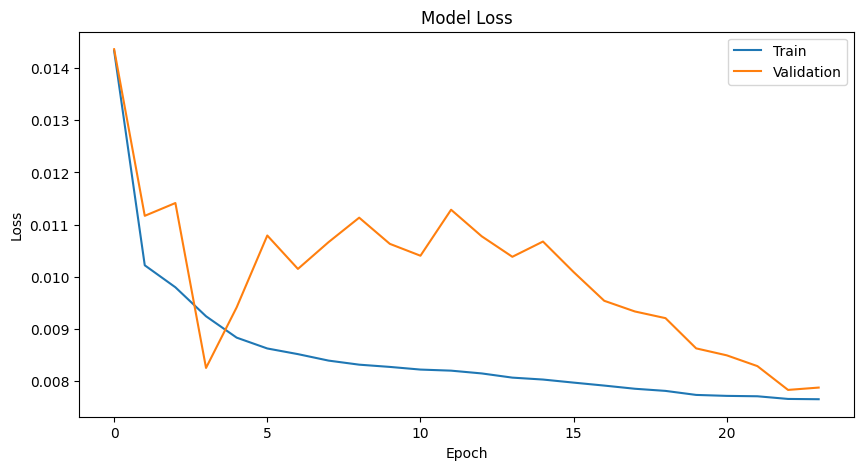

865/865 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
217/217 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

Train MAE: 0.466
Train MSE: 0.380
Train RMSE: 0.616
Train R² score: 0.558

Test MAE: 0.445
Test MSE: 0.326
Test RMSE: 0.571
Test R² score: 0.376


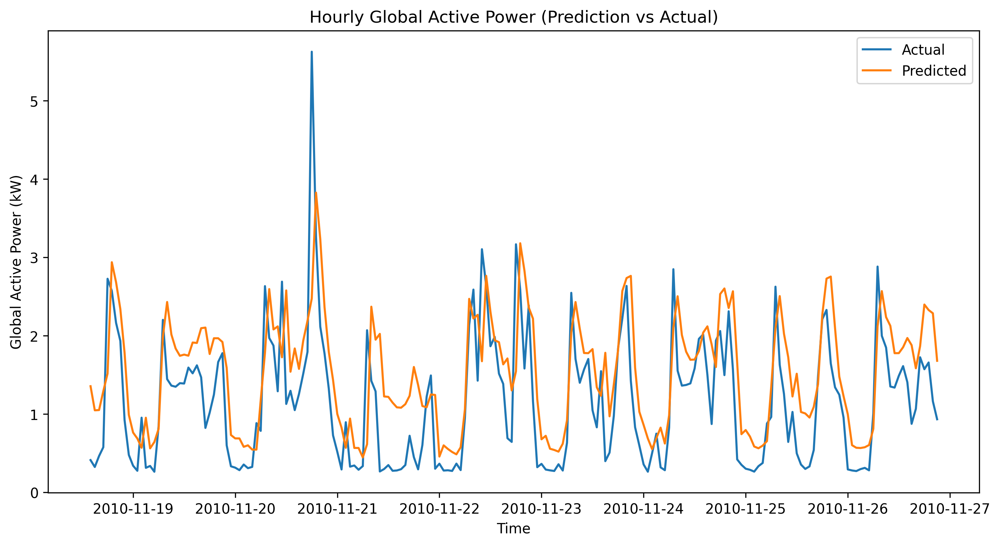

In [27]:
# Define sequence length and features
sequence_length = 24             # Number of time steps to consider in each sequence
num_features = len(df3.columns)  # Number of features

# Create sequences and corresponding labels
sequences = []
labels = []
for i in range(len(scaled_df3) - sequence_length):
    seq = scaled_df3[i:i+sequence_length]
    label = scaled_df3[i+sequence_length][0]  # 'Global_Active_Power' column index
    sequences.append(seq)
    labels.append(label)

# Convert to numpy arrays
sequences = np.array(sequences)
labels = np.array(labels)

# Split into train and test sets
train_size = int(0.8 * len(sequences))
X_train, X_test = sequences[:train_size], sequences[train_size:]
y_train, y_test = labels[:train_size], labels[train_size:]

# Check the shape of Train & Test Split
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Create the LSTM model
model = Sequential()
model.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(1))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Displaying a summary of the model
model.summary()

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=20 , min_delta=0.005)

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test),
                    verbose=2, shuffle=False, callbacks=[early_stopping])

# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Predict train and test data using the trained model
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Perform inverse transformation to rescale back to original range
# y_true values for train data
y_train_copies = np.repeat(y_train.reshape(-1, 1), X_train.shape[-1], axis=-1)
true_y_train = scaler.inverse_transform(y_train_copies)[:,0]

# predicted values for train data
train_prediction_copies = np.repeat(train_predict, df3.shape[-1], axis=-1)
pred_y_train = scaler.inverse_transform(train_prediction_copies)[:,0]

# y_true values for test data
y_test_copies = np.repeat(y_test.reshape(-1, 1), X_test.shape[-1], axis=-1)
true_y_test = scaler.inverse_transform(y_test_copies)[:,0]

# predicted values for test data
test_prediction_copies = np.repeat(test_predict, df3.shape[-1], axis=-1)
pred_y_test = scaler.inverse_transform(test_prediction_copies)[:,0]

# Calculate evaluation metrics
print(f'\nTrain MAE: {mean_absolute_error(true_y_train, pred_y_train):.3f}')
print(f'Train MSE: {mean_squared_error(true_y_train, pred_y_train):.3f}')
print(f'Train RMSE: {np.sqrt(mean_squared_error(true_y_train, pred_y_train)):.3f}')
print(f'Train R² score: {r2_score(true_y_train, pred_y_train):.3f}')

print(f'\nTest MAE: {mean_absolute_error(true_y_test, pred_y_test):.3f}')
print(f'Test MSE: {mean_squared_error(true_y_test, pred_y_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(true_y_test, pred_y_test)):.3f}')
print(f'Test R² score: {r2_score(true_y_test, pred_y_test):.3f}')

# Plotting predicted and actual temperatures
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df3.index[-200:], true_y_test[-200:], label='Actual')
plt.plot(df3.index[-200:], pred_y_test[-200:], label='Predicted')
plt.title('Hourly Global Active Power (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.show()

# Multivariate-3 for hourly resampled data

In [28]:
# hourly resampled data
hourly_resampled = df_imputed.resample('H').mean()

# Make new dataframe after removing highly co-related column
df4 = hourly_resampled.copy()

## Feature Engineering

In [29]:
# Create new columns for hour, day, quarter, month, and year
df4['hour'] = df4.index.hour
df4['month'] = df4.index.month
df4['quarter'] = df4.index.quarter
df4['year'] = df4.index.year
df4['week_of_year'] = df4.index.isocalendar().week
df4['day_of_week'] = df4.index.dayofweek
df4['day_of_month'] = df4.index.day
df4['day_of_year'] = df4.index.dayofyear
df4

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Sub_metering_4,hour,month,quarter,year,week_of_year,day_of_week,day_of_month,day_of_year
date_time,,,,,,,,,,,,,,,,
2006-12-16 17:00:00,4.222889,0.229000,234.643889,18.100000,0.0,0.527778,16.861111,52.992593,17,12,4,2006,50,5,16,350
2006-12-16 18:00:00,3.632200,0.080033,234.580167,15.600000,0.0,6.716667,16.866667,36.953333,18,12,4,2006,50,5,16,350
2006-12-16 19:00:00,3.400233,0.085233,233.232500,14.503333,0.0,1.433333,16.683333,38.553889,19,12,4,2006,50,5,16,350
2006-12-16 20:00:00,3.268567,0.075100,234.071500,13.916667,0.0,0.000000,16.783333,37.692778,20,12,4,2006,50,5,16,350
2006-12-16 21:00:00,3.056467,0.076667,237.158667,13.046667,0.0,0.416667,17.216667,33.307778,21,12,4,2006,50,5,16,350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-11-26 17:00:00,1.725900,0.061400,237.069667,7.216667,0.0,0.000000,12.866667,15.898333,17,11,4,2010,47,4,26,330
2010-11-26 18:00:00,1.573467,0.053700,237.531833,6.620000,0.0,0.000000,0.000000,26.224444,18,11,4,2010,47,4,26,330
2010-11-26 19:00:00,1.659333,0.060033,236.741000,7.056667,0.0,0.066667,0.000000,27.588889,19,11,4,2010,47,4,26,330


## EDA

Shape after Hourly resampling of data : (34589, 16) 


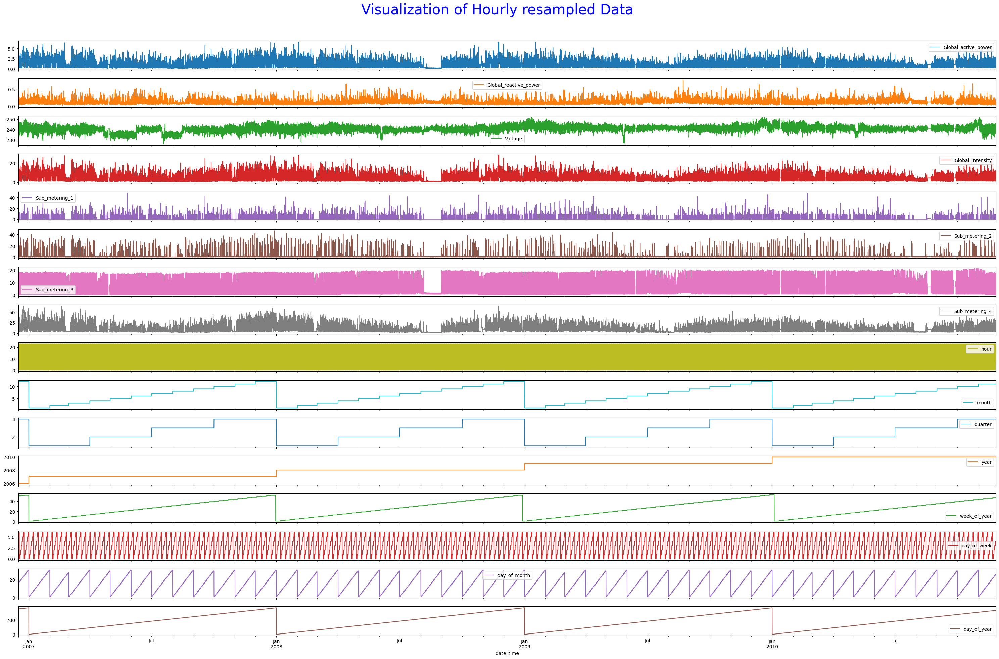

 

************************************************ Hourly Resampled distribution Plot **************************************************



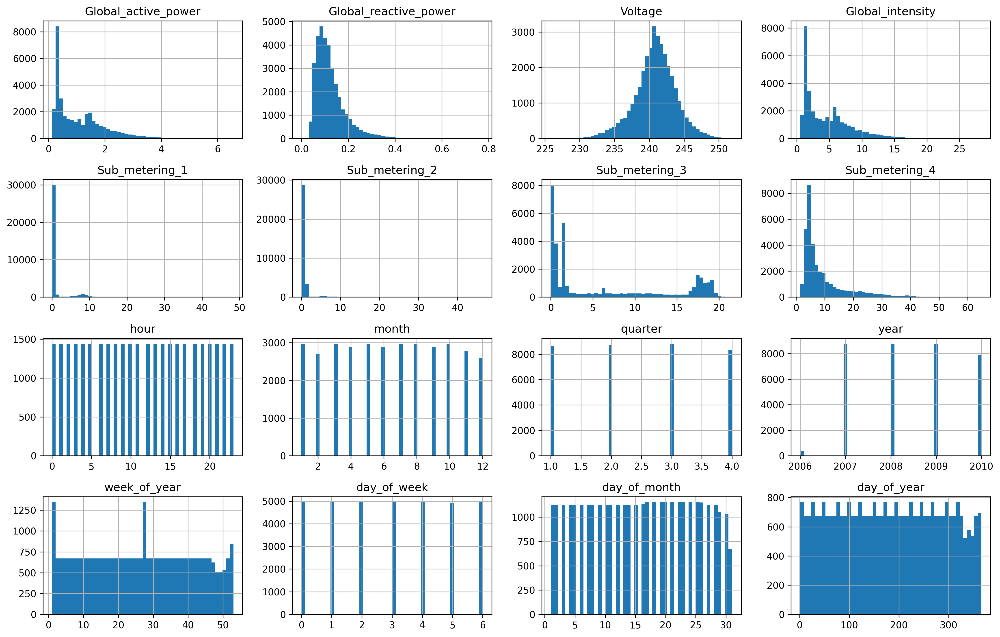

 

************************************************ Correlation Plot for Hourly Resampled Data **************************************************



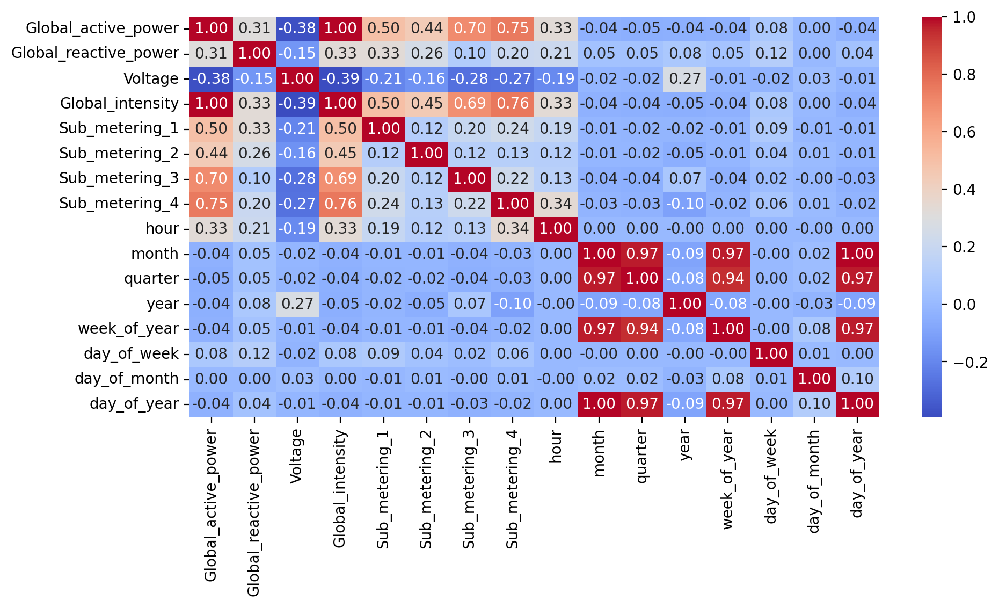

In [30]:
# Plot the visualization, distribution and correlation of Daily resampled data
df_visu_dist_corr(df4, "H", "Hourly")

In [32]:
df4 = df4.drop(['Global_intensity','Sub_metering_3', 'Sub_metering_4'], axis=1)
df4

,Global_active_power,Global_reactive_power,Voltage,Sub_metering_1,Sub_metering_2,hour,month,quarter,year,week_of_year,day_of_week,day_of_month,day_of_year
date_time,,,,,,,,,,,,,
2006-12-16 17:00:00,4.222889,0.229000,234.643889,0.0,0.527778,17,12,4,2006,50,5,16,350
2006-12-16 18:00:00,3.632200,0.080033,234.580167,0.0,6.716667,18,12,4,2006,50,5,16,350
2006-12-16 19:00:00,3.400233,0.085233,233.232500,0.0,1.433333,19,12,4,2006,50,5,16,350
2006-12-16 20:00:00,3.268567,0.075100,234.071500,0.0,0.000000,20,12,4,2006,50,5,16,350
2006-12-16 21:00:00,3.056467,0.076667,237.158667,0.0,0.416667,21,12,4,2006,50,5,16,350
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-11-26 17:00:00,1.725900,0.061400,237.069667,0.0,0.000000,17,11,4,2010,47,4,26,330
2010-11-26 18:00:00,1.573467,0.053700,237.531833,0.0,0.000000,18,11,4,2010,47,4,26,330
2010-11-26 19:00:00,1.659333,0.060033,236.741000,0.0,0.066667,19,11,4,2010,47,4,26,330


## Data Normalization

In [33]:
# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))

# Scale the data
scaled_df4 = scaler.fit_transform(df4)

# Shape of scaled data
scaled_df4

array([[0.63681623, 0.29573827, 0.33794529, ..., 0.83333333, 0.5       ,
        0.95616438],
       [0.54504495, 0.10335773, 0.33550078, ..., 0.83333333, 0.5       ,
        0.95616438],
       [0.50900588, 0.11007318, 0.28380167, ..., 0.83333333, 0.5       ,
        0.95616438],
       ...,
       [0.2385342 , 0.07752906, 0.41839455, ..., 0.66666667, 0.83333333,
        0.90136986],
       [0.16153105, 0.07899268, 0.52024552, ..., 0.66666667, 0.83333333,
        0.90136986],
       [0.12594772, 0.        , 0.53152393, ..., 0.66666667, 0.83333333,
        0.90136986]])

## LSTM-1 Adam(lr=0.001) seq=24 epochs=50 batch_size=32

(27652, 24, 13) (27652,) (6913, 24, 13) (6913,)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                        │ (None, 100)                 │          45,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 45,701 (178.52 KB)

 Trainable params: 45,701 (178.52 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
865/865 - 5s - 6ms/step - loss: 0.0137 - val_loss: 0.0119
Epoch 2/50
865/865 - 5s - 6ms/step - loss: 0.0098 - val_loss: 0.0113
Epoch 3/50
865/865 - 4s - 4ms/step - loss: 0.0092 - val_loss: 0.0121
Epoch 4/50
865/865 - 5s - 6ms/step - loss: 0.0089 - val_loss: 0.0113
Epoch 5/50
865/865 - 6s - 7ms/step - loss: 0.0086 - val_loss: 0.0105
Epoch 6/50
865/865 - 4s - 4ms/step - loss: 0.0084 - val_loss: 0.0104
Epoch 7/50
865/865 - 5s - 6ms/step - loss: 0.0083 - val_loss: 0.0107
Epoch 8/50
865/865 - 6s - 7ms/step - loss: 0.0081 - val_loss: 0.0103
Epoch 9/50
865/865 - 4s - 5ms/step - loss: 0.0081 - val_loss: 0.0105
Epoch 10/50
865/865 - 4s - 4ms/step - loss: 0.0080 - val_loss: 0.0104
Epoch 11/50
865/865 - 6s - 7ms/step - loss: 0.0079 - val_loss: 0.0109
Epoch 12/50
865/865 - 4s - 4ms/step - loss: 0.0079 - val_loss: 0.0112
Epoch 13/50
865/865 - 4s - 4ms/step - loss: 0.0078 - val_loss: 0.0102
Epoch 14/50
865/865 - 7s - 8ms/step - loss: 0.0078 - val_loss: 0.0107
Epoch 15/50
865/865 - 7s - 9m

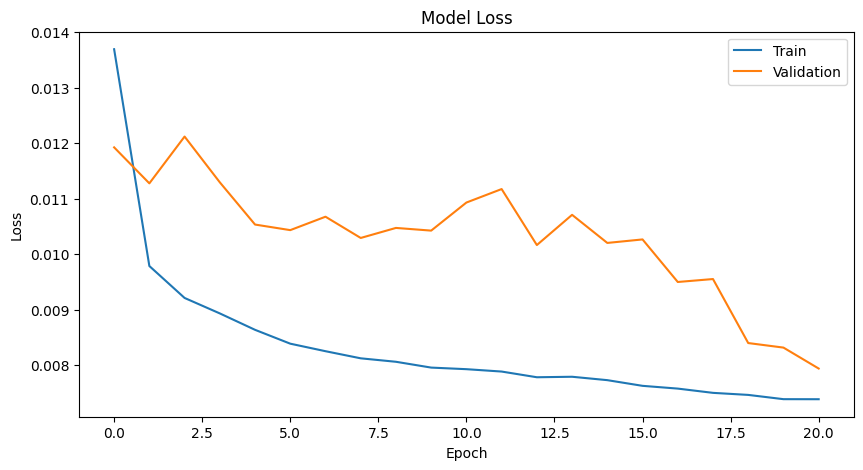

865/865 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
217/217 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

Train MAE: 0.495
Train MSE: 0.405
Train RMSE: 0.636
Train R² score: 0.529

Test MAE: 0.449
Test MSE: 0.329
Test RMSE: 0.574
Test R² score: 0.371


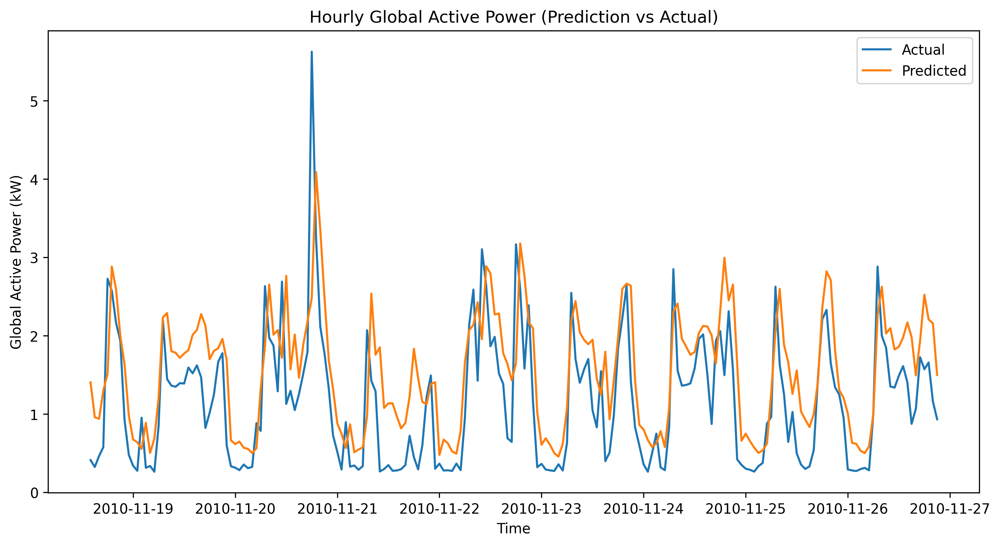

In [34]:
# Define sequence length and features
sequence_length = 24             # Number of time steps to consider in each sequence
num_features = len(df4.columns)  # Number of features

# Create sequences and corresponding labels
sequences = []
labels = []
for i in range(len(scaled_df4) - sequence_length):
    seq = scaled_df4[i:i+sequence_length]
    label = scaled_df4[i+sequence_length][0]  # 'Global_Active_Power' column index
    sequences.append(seq)
    labels.append(label)

# Convert to numpy arrays
sequences = np.array(sequences)
labels = np.array(labels)

# Split into train and test sets
train_size = int(0.8 * len(sequences))
X_train, X_test = sequences[:train_size], sequences[train_size:]
y_train, y_test = labels[:train_size], labels[train_size:]

# Check the shape of Train & Test Split
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Create the LSTM model
model = Sequential()
model.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(1))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Displaying a summary of the model
model.summary()

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=20 , min_delta=0.005)

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test),
                    verbose=2, shuffle=False, callbacks=[early_stopping])

# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Predict train and test data using the trained model
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Perform inverse transformation to rescale back to original range
# y_true values for train data
y_train_copies = np.repeat(y_train.reshape(-1, 1), X_train.shape[-1], axis=-1)
true_y_train = scaler.inverse_transform(y_train_copies)[:,0]

# predicted values for train data
train_prediction_copies = np.repeat(train_predict, df4.shape[-1], axis=-1)
pred_y_train = scaler.inverse_transform(train_prediction_copies)[:,0]

# y_true values for test data
y_test_copies = np.repeat(y_test.reshape(-1, 1), X_test.shape[-1], axis=-1)
true_y_test = scaler.inverse_transform(y_test_copies)[:,0]

# predicted values for test data
test_prediction_copies = np.repeat(test_predict, df4.shape[-1], axis=-1)
pred_y_test = scaler.inverse_transform(test_prediction_copies)[:,0]

# Calculate evaluation metrics
print(f'\nTrain MAE: {mean_absolute_error(true_y_train, pred_y_train):.3f}')
print(f'Train MSE: {mean_squared_error(true_y_train, pred_y_train):.3f}')
print(f'Train RMSE: {np.sqrt(mean_squared_error(true_y_train, pred_y_train)):.3f}')
print(f'Train R² score: {r2_score(true_y_train, pred_y_train):.3f}')

print(f'\nTest MAE: {mean_absolute_error(true_y_test, pred_y_test):.3f}')
print(f'Test MSE: {mean_squared_error(true_y_test, pred_y_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(true_y_test, pred_y_test)):.3f}')
print(f'Test R² score: {r2_score(true_y_test, pred_y_test):.3f}')

# Plotting predicted and actual temperatures
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df4.index[-200:], true_y_test[-200:], label='Actual')
plt.plot(df4.index[-200:], pred_y_test[-200:], label='Predicted')
plt.title('Hourly Global Active Power (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.show()

# Univariate for daily resampled data

## Daily resampled data

In [35]:
# Resampled the data
daily_resampled = df_imputed.resample('D').mean()

In [36]:
# Select the 'Global_active_power' column from the DataFrame
df5 = daily_resampled['Global_active_power']
df5

,Global_active_power
date_time,
2006-12-16,3.053475
2006-12-17,2.354486
2006-12-18,1.530435
2006-12-19,1.157079
2006-12-20,1.545658
...,...
2010-11-22,1.417733
2010-11-23,1.095511
2010-11-24,1.247394


## Data Normalization

In [37]:
# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))

# Scale the data
scaled_df5 = scaler.fit_transform(df5.values.reshape(-1, 1))

# Shape of scaled data
scaled_df5

array([[0.91678642],
       [0.6942518 ],
       [0.43190139],
       ...,
       [0.34179083],
       [0.26107518],
       [0.31977106]])

## LSTM-1 Adam(lr=0.001) seq=7 epochs=50 batch_size=32

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_4 (LSTM)                        │ (None, 100)                 │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 40,901 (159.77 KB)

 Trainable params: 40,901 (159.77 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
36/36 - 1s - 38ms/step - loss: 0.0325 - val_loss: 0.0070
Epoch 2/50
36/36 - 0s - 12ms/step - loss: 0.0126 - val_loss: 0.0059
Epoch 3/50
36/36 - 0s - 5ms/step - loss: 0.0120 - val_loss: 0.0060
Epoch 4/50
36/36 - 0s - 8ms/step - loss: 0.0117 - val_loss: 0.0059
Epoch 5/50
36/36 - 0s - 5ms/step - loss: 0.0115 - val_loss: 0.0058
Epoch 6/50
36/36 - 0s - 5ms/step - loss: 0.0112 - val_loss: 0.0059
Epoch 7/50
36/36 - 0s - 5ms/step - loss: 0.0113 - val_loss: 0.0058
Epoch 8/50
36/36 - 0s - 5ms/step - loss: 0.0112 - val_loss: 0.0058
Epoch 9/50
36/36 - 0s - 5ms/step - loss: 0.0112 - val_loss: 0.0058
Epoch 10/50
36/36 - 0s - 8ms/step - loss: 0.0112 - val_loss: 0.0057
Epoch 11/50
36/36 - 0s - 8ms/step - loss: 0.0113 - val_loss: 0.0058
Epoch 12/50
36/36 - 0s - 5ms/step - loss: 0.0112 - val_loss: 0.0057
Epoch 13/50
36/36 - 0s - 8ms/step - loss: 0.0114 - val_loss: 0.0057
Epoch 14/50
36/36 - 0s - 5ms/step - loss: 0.0112 - val_loss: 0.0057
Epoch 15/50
36/36 - 0s - 5ms/step - loss: 0.0111 - val_

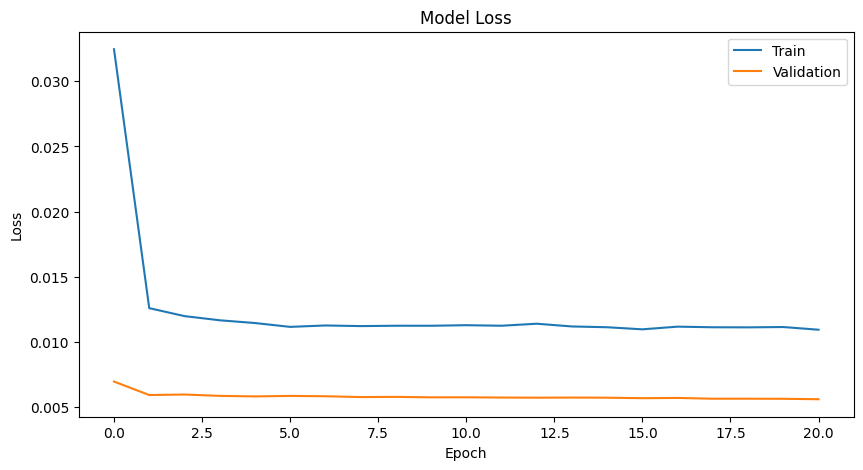

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

Train MAE: 0.237
Train MSE: 0.103
Train RMSE: 0.320
Train R² score: 0.454

Test MAE: 0.176
Test MSE: 0.055
Test RMSE: 0.235
Test R² score: 0.388


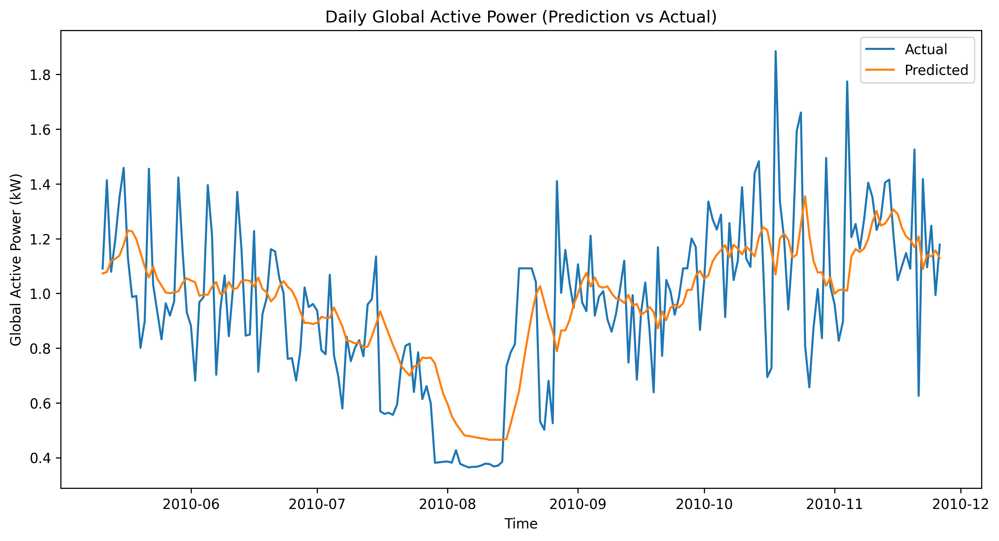

In [38]:
# Define sequence length and features
sequence_length = 7              # Number of time steps to consider in each sequence
num_features = 1                 # Number of features

# Create sequences and corresponding labels
sequences = []
labels = []
for i in range(len(scaled_df5) - sequence_length):
    seq = scaled_df5[i:i+sequence_length]
    label = scaled_df5[i+sequence_length][0]  # 'Global_Active_Power' column index
    sequences.append(seq)
    labels.append(label)

# Convert to numpy arrays
sequences = np.array(sequences)
labels = np.array(labels)

# Split into train and test sets
train_size = int(0.8 * len(sequences))
X_train, X_test = sequences[:train_size], sequences[train_size:]
y_train, y_test = labels[:train_size], labels[train_size:]

# Check the shape of Train & Test Split
X_train.shape, y_train.shape, X_test.shape, y_test.shape

# Create the LSTM model
model = Sequential()
model.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(1))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Displaying a summary of the model
model.summary()

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=20 , min_delta=0.005)

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test),
                    verbose=2, shuffle=False, callbacks=[early_stopping])

# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Predict train and test data using the trained model
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Perform inverse transformation to rescale back to original range
# y_true values for train data
y_train_copies = np.repeat(y_train.reshape(-1, 1), X_train.shape[-1], axis=-1)
true_y_train = scaler.inverse_transform(y_train_copies)[:,0]

# predicted values for train data
train_prediction_copies = np.repeat(train_predict, df5.shape[-1], axis=-1)
pred_y_train = scaler.inverse_transform(train_prediction_copies)[:,0]

# y_true values for test data
y_test_copies = np.repeat(y_test.reshape(-1, 1), X_test.shape[-1], axis=-1)
true_y_test = scaler.inverse_transform(y_test_copies)[:,0]

# predicted values for test data
test_prediction_copies = np.repeat(test_predict, df5.shape[-1], axis=-1)
pred_y_test = scaler.inverse_transform(test_prediction_copies)[:,0]

# Calculate evaluation metrics
print(f'\nTrain MAE: {mean_absolute_error(true_y_train, pred_y_train):.3f}')
print(f'Train MSE: {mean_squared_error(true_y_train, pred_y_train):.3f}')
print(f'Train RMSE: {np.sqrt(mean_squared_error(true_y_train, pred_y_train)):.3f}')
print(f'Train R² score: {r2_score(true_y_train, pred_y_train):.3f}')

print(f'\nTest MAE: {mean_absolute_error(true_y_test, pred_y_test):.3f}')
print(f'Test MSE: {mean_squared_error(true_y_test, pred_y_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(true_y_test, pred_y_test)):.3f}')
print(f'Test R² score: {r2_score(true_y_test, pred_y_test):.3f}')

# Plotting predicted and actual temperatures
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df5.index[-200:], true_y_test[-200:], label='Actual')
plt.plot(df5.index[-200:], pred_y_test[-200:], label='Predicted')
plt.title('Daily Global Active Power (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.show()

# Multivariate-1 for for daily resampled data

In [39]:
# Resampled the data
daily_resampled = df_imputed.resample('D').mean()

## EDA

In [40]:
# Define a function to plot the visualization, distribution and correlation of resampled data
def df_visu_dist_corr(dataset, resample_type, title):

  # Resample the data
  df_resampled = dataset.resample(resample_type).mean()

  print('Shape after %s resampling of data : %s ' %(title, df_resampled.shape))

  # Plot Resampled Data set
  df_resampled.plot(subplots=True, figsize=(30,20))
  plt.suptitle("Visualization of %s resampled Data" %title, fontsize=30, color='blue')
  plt.tight_layout(rect=[0, 0, 1, 0.96])
  plt.show()

  # Plot distribution
  print(' \n\n************************************************ %s Resampled distribution Plot **************************************************' %title, end="\n\n")
  df_resampled.hist(figsize=(15, 10), bins=50)
  plt.tight_layout(rect=[0, 0, 1, 0.96])
  plt.gcf().set_dpi(300)
  plt.show()

  # Plot correlation plot
  print(' \n\n************************************************ Correlation Plot for %s Resampled Data **************************************************' %title, end="\n\n")
  plt.figure(figsize=(10,6))
  sns.heatmap(df_resampled.corr(), annot=True, cmap='coolwarm', fmt='.2f')
  plt.tight_layout(rect=[0, 0, 1, 0.96])
  plt.gcf().set_dpi(200)
  plt.show()

Shape after Hourly resampling of data : (34589, 8) 


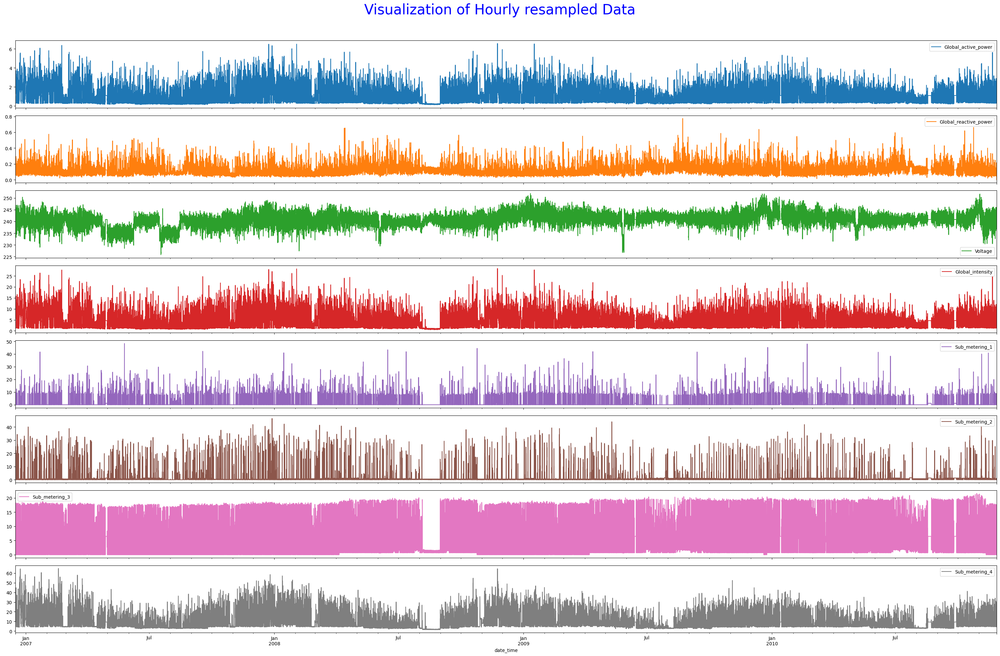

 

************************************************ Hourly Resampled distribution Plot **************************************************



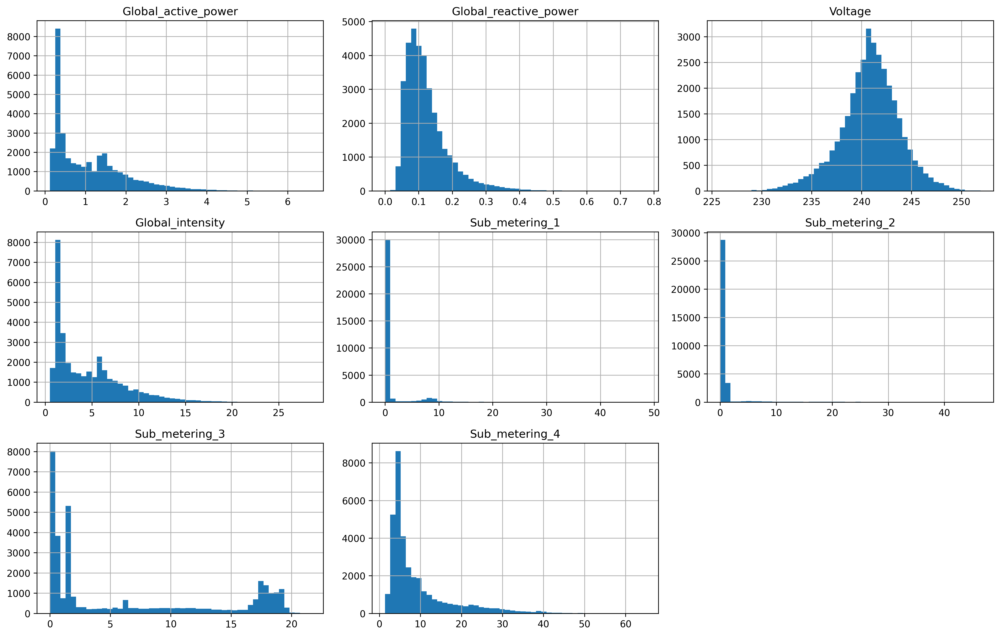

 

************************************************ Correlation Plot for Hourly Resampled Data **************************************************



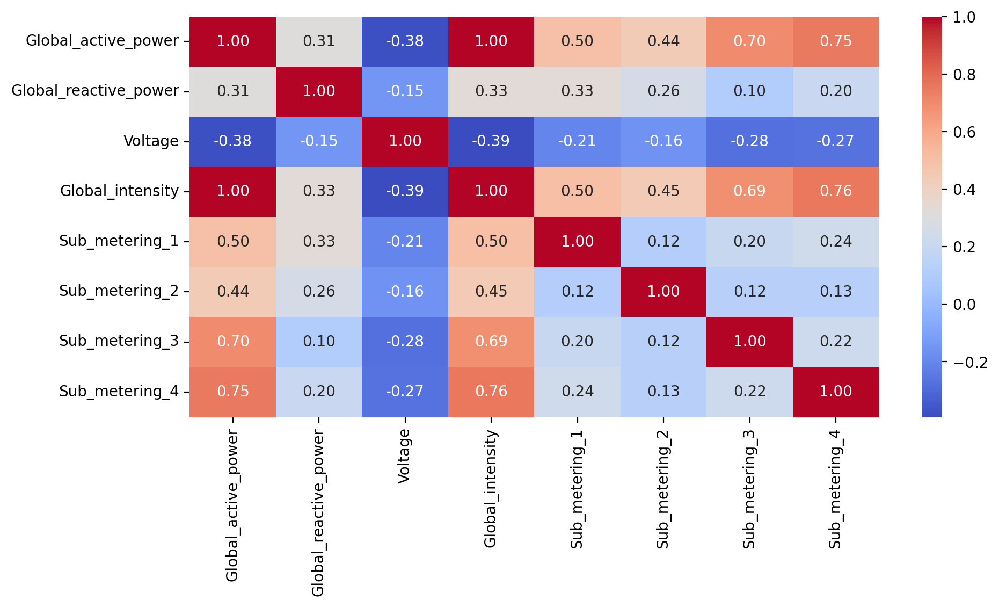

In [41]:
# Plot the visualization, distribution and correlation of Daily resampled data
df_visu_dist_corr(df_imputed, "H", "Hourly")

Note:- As Global_intensity and sub_metering_4 are highly correlated with Global_active_power so I am removing those columns

In [42]:
df6 = daily_resampled.drop(['Global_intensity','Sub_metering_3','Sub_metering_4'], axis=1)
df6

,Global_active_power,Global_reactive_power,Voltage,Sub_metering_1,Sub_metering_2
date_time,,,,,
2006-12-16,3.053475,0.088187,236.243763,0.000000,1.378788
2006-12-17,2.354486,0.156949,240.087028,1.411806,2.907639
2006-12-18,1.530435,0.112356,241.231694,0.738194,1.820139
2006-12-19,1.157079,0.104821,241.999313,0.582639,5.279167
2006-12-20,1.545658,0.111804,242.308062,0.000000,1.838889
...,...,...,...,...,...
2010-11-22,1.417733,0.098857,240.197118,3.371528,1.465278
2010-11-23,1.095511,0.095451,240.575528,1.299306,0.318056
2010-11-24,1.247394,0.091986,240.030965,0.761111,1.977778


## Data Normalization

In [43]:
# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))

# Scale the data
scaled_df6 = scaler.fit_transform(df6)

# Shape of scaled data
scaled_df6

array([[0.91678642, 0.13073198, 0.3153853 , 0.        , 0.16396519],
       [0.6942518 , 0.42667057, 0.55049373, 0.18185686, 0.34577587],
       [0.43190139, 0.23474981, 0.62051772, 0.09508797, 0.21645057],
       ...,
       [0.34179083, 0.14708326, 0.54706415, 0.0980399 , 0.23519696],
       [0.26107518, 0.0982707 , 0.63914907, 0.09625085, 0.03518044],
       [0.31977106, 0.16292032, 0.56297334, 0.11014764, 0.0362503 ]])

## LSTM-1 Adam(lr=0.001) seq=7 epochs=50 batch_size=32

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_5 (LSTM)                        │ (None, 100)                 │          42,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 42,501 (166.02 KB)

 Trainable params: 42,501 (166.02 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
36/36 - 2s - 43ms/step - loss: 0.0416 - val_loss: 0.0073
Epoch 2/50
36/36 - 0s - 12ms/step - loss: 0.0161 - val_loss: 0.0064
Epoch 3/50
36/36 - 0s - 8ms/step - loss: 0.0144 - val_loss: 0.0062
Epoch 4/50
36/36 - 0s - 5ms/step - loss: 0.0133 - val_loss: 0.0061
Epoch 5/50
36/36 - 0s - 5ms/step - loss: 0.0127 - val_loss: 0.0060
Epoch 6/50
36/36 - 0s - 5ms/step - loss: 0.0119 - val_loss: 0.0059
Epoch 7/50
36/36 - 0s - 5ms/step - loss: 0.0115 - val_loss: 0.0059
Epoch 8/50
36/36 - 0s - 8ms/step - loss: 0.0118 - val_loss: 0.0058
Epoch 9/50
36/36 - 0s - 8ms/step - loss: 0.0114 - val_loss: 0.0057
Epoch 10/50
36/36 - 0s - 5ms/step - loss: 0.0110 - val_loss: 0.0058
Epoch 11/50
36/36 - 0s - 5ms/step - loss: 0.0114 - val_loss: 0.0057
Epoch 12/50
36/36 - 0s - 8ms/step - loss: 0.0111 - val_loss: 0.0057
Epoch 13/50
36/36 - 0s - 8ms/step - loss: 0.0113 - val_loss: 0.0056
Epoch 14/50
36/36 - 0s - 10ms/step - loss: 0.0106 - val_loss: 0.0058
Epoch 15/50
36/36 - 0s - 5ms/step - loss: 0.0108 - val

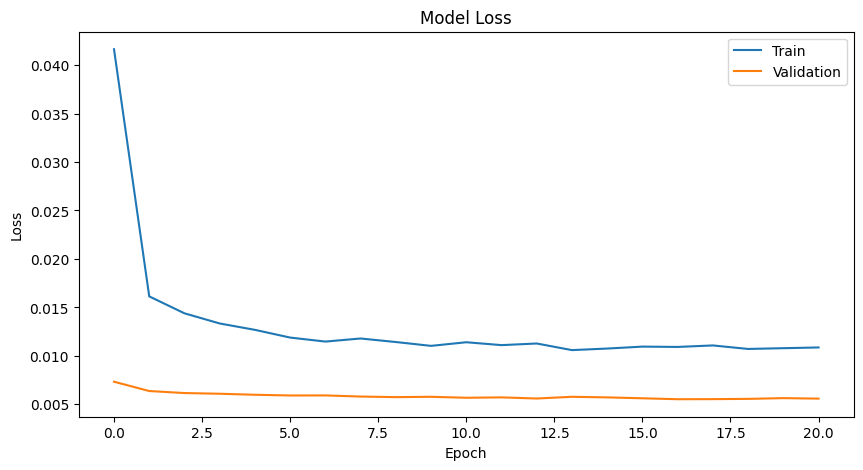

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

Train MAE: 0.235
Train MSE: 0.099
Train RMSE: 0.315
Train R² score: 0.471

Test MAE: 0.180
Test MSE: 0.055
Test RMSE: 0.235
Test R² score: 0.390


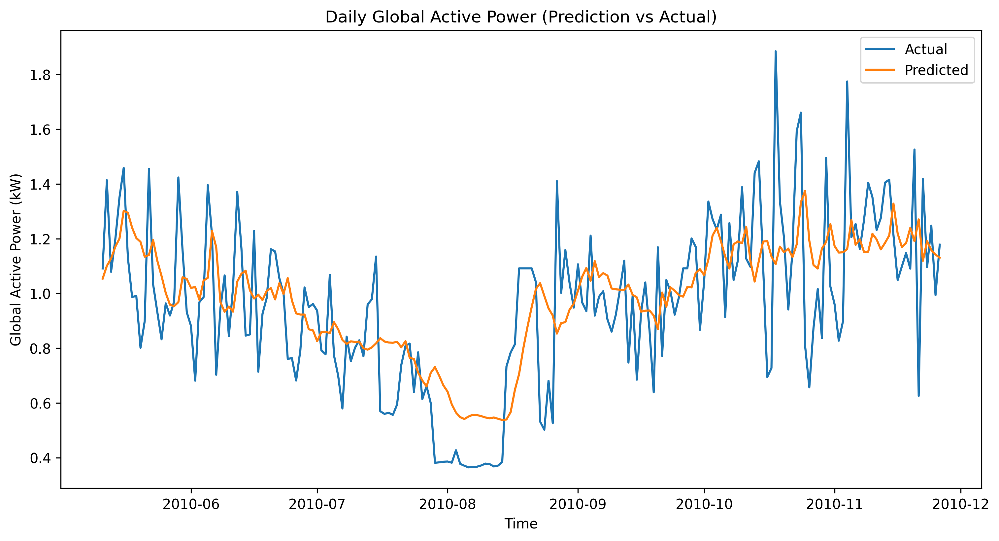

In [44]:
# Define sequence length and features
sequence_length = 7              # Number of time steps to consider in each sequence
num_features = len(df6.columns)  # Number of features

# Create sequences and corresponding labels
sequences = []
labels = []
for i in range(len(scaled_df6) - sequence_length):
    seq = scaled_df6[i:i+sequence_length]
    label = scaled_df6[i+sequence_length][0]  # 'Global_Active_Power' column index
    sequences.append(seq)
    labels.append(label)

# Convert to numpy arrays
sequences = np.array(sequences)
labels = np.array(labels)

# Split into train and test sets
train_size = int(0.8 * len(sequences))
X_train, X_test = sequences[:train_size], sequences[train_size:]
y_train, y_test = labels[:train_size], labels[train_size:]

# Check the shape of Train & Test Split
X_train.shape, y_train.shape, X_test.shape, y_test.shape

# Create the LSTM model
model = Sequential()
model.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(1))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Displaying a summary of the model
model.summary()

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=20 , min_delta=0.005)

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test),
                    verbose=2, shuffle=False, callbacks=[early_stopping])

# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Predict train and test data using the trained model
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Perform inverse transformation to rescale back to original range
# y_true values for train data
y_train_copies = np.repeat(y_train.reshape(-1, 1), X_train.shape[-1], axis=-1)
true_y_train = scaler.inverse_transform(y_train_copies)[:,0]

# predicted values for train data
train_prediction_copies = np.repeat(train_predict, df6.shape[-1], axis=-1)
pred_y_train = scaler.inverse_transform(train_prediction_copies)[:,0]

# y_true values for test data
y_test_copies = np.repeat(y_test.reshape(-1, 1), X_test.shape[-1], axis=-1)
true_y_test = scaler.inverse_transform(y_test_copies)[:,0]

# predicted values for test data
test_prediction_copies = np.repeat(test_predict, df6.shape[-1], axis=-1)
pred_y_test = scaler.inverse_transform(test_prediction_copies)[:,0]

# Calculate evaluation metrics
print(f'\nTrain MAE: {mean_absolute_error(true_y_train, pred_y_train):.3f}')
print(f'Train MSE: {mean_squared_error(true_y_train, pred_y_train):.3f}')
print(f'Train RMSE: {np.sqrt(mean_squared_error(true_y_train, pred_y_train)):.3f}')
print(f'Train R² score: {r2_score(true_y_train, pred_y_train):.3f}')

print(f'\nTest MAE: {mean_absolute_error(true_y_test, pred_y_test):.3f}')
print(f'Test MSE: {mean_squared_error(true_y_test, pred_y_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(true_y_test, pred_y_test)):.3f}')
print(f'Test R² score: {r2_score(true_y_test, pred_y_test):.3f}')

# Plotting predicted and actual temperatures
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df6.index[-200:], true_y_test[-200:], label='Actual')
plt.plot(df6.index[-200:], pred_y_test[-200:], label='Predicted')
plt.title('Daily Global Active Power (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.show()

# Multivariate-2 for daily resampled data

In [45]:
# Resampled the data
daily_resampled = df_imputed.resample('D').mean()

# Make new dataframe with Global active power column
df7 = daily_resampled.drop(['Global_reactive_power', 'Voltage',	'Global_intensity',
                             'Sub_metering_1', 'Sub_metering_2','Sub_metering_3','Sub_metering_4'], axis=1)

## Feature Engineering

In [46]:
# Create new columns for hour, day, quarter, month, and year
df7['hour'] = df7.index.hour
df7['month'] = df7.index.month
df7['quarter'] = df7.index.quarter
df7['year'] = df7.index.year
df7['week_of_year'] = df7.index.isocalendar().week
df7['day_of_week'] = df7.index.dayofweek
df7['day_of_month'] = df7.index.day
df7['day_of_year'] = df7.index.dayofyear
df7

,Global_active_power,hour,month,quarter,year,week_of_year,day_of_week,day_of_month,day_of_year
date_time,,,,,,,,,
2006-12-16,3.053475,0,12,4,2006,50,5,16,350
2006-12-17,2.354486,0,12,4,2006,50,6,17,351
2006-12-18,1.530435,0,12,4,2006,51,0,18,352
2006-12-19,1.157079,0,12,4,2006,51,1,19,353
2006-12-20,1.545658,0,12,4,2006,51,2,20,354
...,...,...,...,...,...,...,...,...,...
2010-11-22,1.417733,0,11,4,2010,47,0,22,326
2010-11-23,1.095511,0,11,4,2010,47,1,23,327
2010-11-24,1.247394,0,11,4,2010,47,2,24,328


## Data Normalization

In [47]:
# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))

# Scale the data
scaled_df7 = scaler.fit_transform(df7)

# Shape of scaled data
scaled_df7

array([[0.91678642, 0.        , 1.        , ..., 0.83333333, 0.5       ,
        0.95616438],
       [0.6942518 , 0.        , 1.        , ..., 1.        , 0.53333333,
        0.95890411],
       [0.43190139, 0.        , 1.        , ..., 0.        , 0.56666667,
        0.96164384],
       ...,
       [0.34179083, 0.        , 0.90909091, ..., 0.33333333, 0.76666667,
        0.89589041],
       [0.26107518, 0.        , 0.90909091, ..., 0.5       , 0.8       ,
        0.89863014],
       [0.31977106, 0.        , 0.90909091, ..., 0.66666667, 0.83333333,
        0.90136986]])

## LSTM-1 Adam(lr=0.001) seq=7 epochs=50 batch_size=32

(1148, 7, 9) (1148,) (287, 7, 9) (287,)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                        │ (None, 100)                 │          44,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 44,101 (172.27 KB)

 Trainable params: 44,101 (172.27 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
36/36 - 1s - 39ms/step - loss: 0.0438 - val_loss: 0.0070
Epoch 2/50
36/36 - 0s - 5ms/step - loss: 0.0156 - val_loss: 0.0066
Epoch 3/50
36/36 - 0s - 5ms/step - loss: 0.0151 - val_loss: 0.0058
Epoch 4/50
36/36 - 0s - 8ms/step - loss: 0.0144 - val_loss: 0.0073
Epoch 5/50
36/36 - 0s - 8ms/step - loss: 0.0142 - val_loss: 0.0090
Epoch 6/50
36/36 - 0s - 8ms/step - loss: 0.0147 - val_loss: 0.0088
Epoch 7/50
36/36 - 0s - 8ms/step - loss: 0.0134 - val_loss: 0.0070
Epoch 8/50
36/36 - 0s - 5ms/step - loss: 0.0128 - val_loss: 0.0073
Epoch 9/50
36/36 - 0s - 8ms/step - loss: 0.0118 - val_loss: 0.0057
Epoch 10/50
36/36 - 0s - 8ms/step - loss: 0.0116 - val_loss: 0.0069
Epoch 11/50
36/36 - 0s - 5ms/step - loss: 0.0116 - val_loss: 0.0077
Epoch 12/50
36/36 - 0s - 8ms/step - loss: 0.0112 - val_loss: 0.0055
Epoch 13/50
36/36 - 0s - 5ms/step - loss: 0.0133 - val_loss: 0.0093
Epoch 14/50
36/36 - 0s - 8ms/step - loss: 0.0119 - val_loss: 0.0066
Epoch 15/50
36/36 - 0s - 11ms/step - loss: 0.0107 - val_

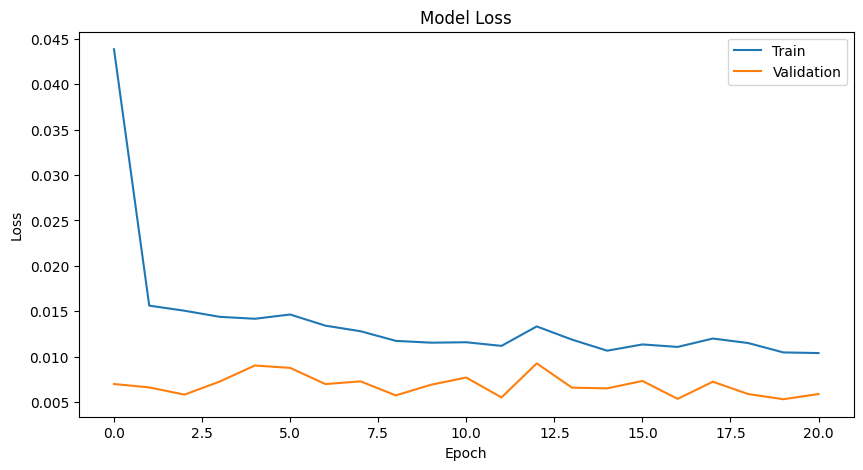

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

Train MAE: 0.240
Train MSE: 0.099
Train RMSE: 0.314
Train R² score: 0.474

Test MAE: 0.187
Test MSE: 0.058
Test RMSE: 0.241
Test R² score: 0.356


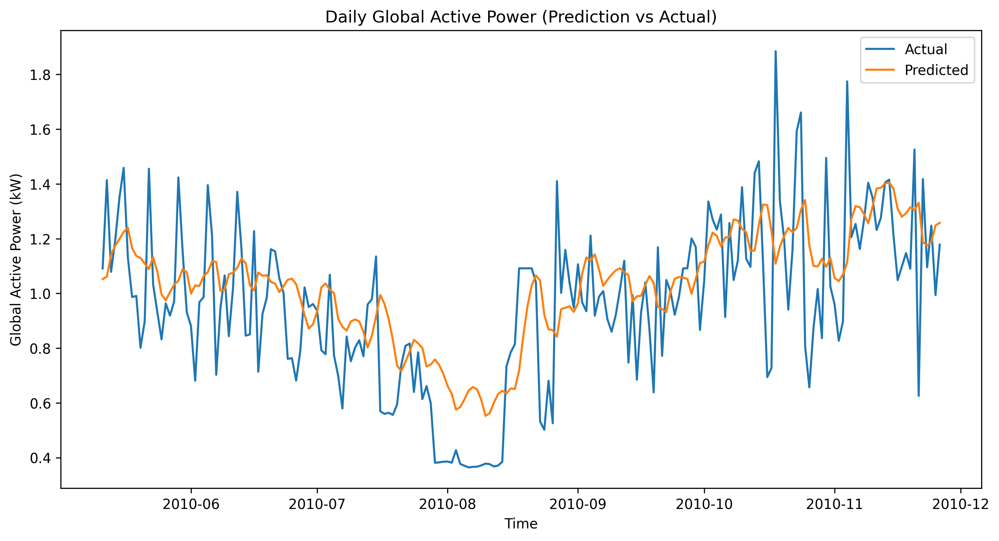

In [48]:
# Define sequence length and features
sequence_length = 7              # Number of time steps to consider in each sequence
num_features = len(df7.columns)  # Number of features

# Create sequences and corresponding labels
sequences = []
labels = []
for i in range(len(scaled_df7) - sequence_length):
    seq = scaled_df7[i:i+sequence_length]
    label = scaled_df7[i+sequence_length][0]  # 'Global_Active_Power' column index
    sequences.append(seq)
    labels.append(label)

# Convert to numpy arrays
sequences = np.array(sequences)
labels = np.array(labels)

# Split into train and test sets
train_size = int(0.8 * len(sequences))
X_train, X_test = sequences[:train_size], sequences[train_size:]
y_train, y_test = labels[:train_size], labels[train_size:]

# Check the shape of Train & Test Split
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Create the LSTM model
model = Sequential()
model.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(1))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Displaying a summary of the model
model.summary()

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=20 , min_delta=0.005)

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test),
                    verbose=2, shuffle=False, callbacks=[early_stopping])

# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Predict train and test data using the trained model
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Perform inverse transformation to rescale back to original range
# y_true values for train data
y_train_copies = np.repeat(y_train.reshape(-1, 1), X_train.shape[-1], axis=-1)
true_y_train = scaler.inverse_transform(y_train_copies)[:,0]

# predicted values for train data
train_prediction_copies = np.repeat(train_predict, df7.shape[-1], axis=-1)
pred_y_train = scaler.inverse_transform(train_prediction_copies)[:,0]

# y_true values for test data
y_test_copies = np.repeat(y_test.reshape(-1, 1), X_test.shape[-1], axis=-1)
true_y_test = scaler.inverse_transform(y_test_copies)[:,0]

# predicted values for test data
test_prediction_copies = np.repeat(test_predict, df7.shape[-1], axis=-1)
pred_y_test = scaler.inverse_transform(test_prediction_copies)[:,0]

# Calculate evaluation metrics
print(f'\nTrain MAE: {mean_absolute_error(true_y_train, pred_y_train):.3f}')
print(f'Train MSE: {mean_squared_error(true_y_train, pred_y_train):.3f}')
print(f'Train RMSE: {np.sqrt(mean_squared_error(true_y_train, pred_y_train)):.3f}')
print(f'Train R² score: {r2_score(true_y_train, pred_y_train):.3f}')

print(f'\nTest MAE: {mean_absolute_error(true_y_test, pred_y_test):.3f}')
print(f'Test MSE: {mean_squared_error(true_y_test, pred_y_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(true_y_test, pred_y_test)):.3f}')
print(f'Test R² score: {r2_score(true_y_test, pred_y_test):.3f}')

# Plotting predicted and actual temperatures
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df7.index[-200:], true_y_test[-200:], label='Actual')
plt.plot(df7.index[-200:], pred_y_test[-200:], label='Predicted')
plt.title('Daily Global Active Power (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.show()

# Multivariate-3 for daily resampled data

In [49]:
# Resampled the data
daily_resampled = df_imputed.resample('D').mean()

# Make new dataframe
df8 = daily_resampled.copy()

## Feature Engineering

In [50]:
# Create new columns for hour, day, quarter, month, and year
df8['hour'] = df8.index.hour
df8['month'] = df8.index.month
df8['quarter'] = df8.index.quarter
df8['year'] = df8.index.year
df8['week_of_year'] = df8.index.isocalendar().week
df8['day_of_week'] = df8.index.dayofweek
df8['day_of_month'] = df8.index.day
df8['day_of_year'] = df8.index.dayofyear
df8

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Sub_metering_4,hour,month,quarter,year,week_of_year,day_of_week,day_of_month,day_of_year
date_time,,,,,,,,,,,,,,,,
2006-12-16,3.053475,0.088187,236.243763,13.082828,0.000000,1.378788,12.439394,37.073064,0,12,4,2006,50,5,16,350
2006-12-17,2.354486,0.156949,240.087028,9.999028,1.411806,2.907639,9.264583,25.657407,0,12,4,2006,50,6,17,351
2006-12-18,1.530435,0.112356,241.231694,6.421667,0.738194,1.820139,9.734722,13.214190,0,12,4,2006,51,0,18,352
2006-12-19,1.157079,0.104821,241.999313,4.926389,0.582639,5.279167,4.303472,9.119375,0,12,4,2006,51,1,19,353
2006-12-20,1.545658,0.111804,242.308062,6.467361,0.000000,1.838889,9.765972,14.156111,0,12,4,2006,51,2,20,354
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-11-22,1.417733,0.098857,240.197118,6.014167,3.371528,1.465278,7.038889,11.753194,0,11,4,2010,47,0,22,326
2010-11-23,1.095511,0.095451,240.575528,4.674444,1.299306,0.318056,5.285417,11.355741,0,11,4,2010,47,1,23,327
2010-11-24,1.247394,0.091986,240.030965,5.249583,0.761111,1.977778,8.488889,9.562130,0,11,4,2010,47,2,24,328


## EDA

Shape after Daily resampling of data : (1442, 16) 


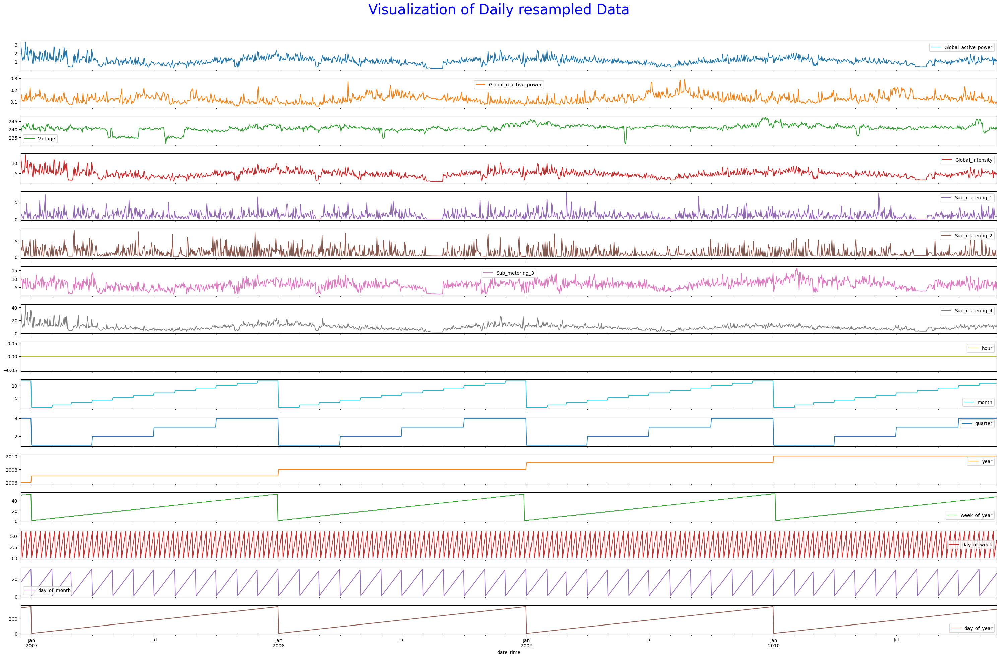

 

************************************************ Daily Resampled distribution Plot **************************************************



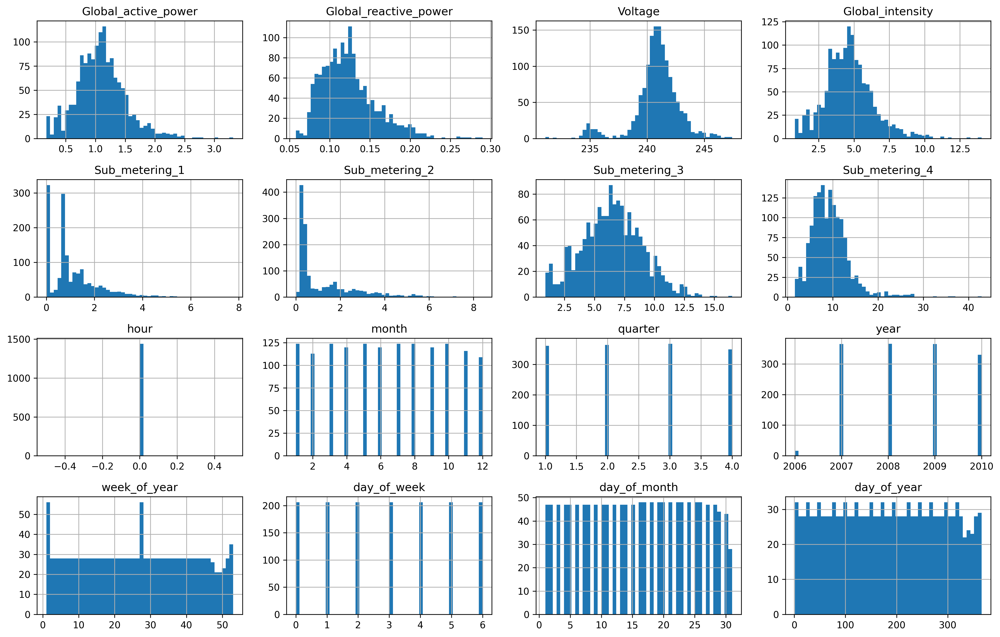

 

************************************************ Correlation Plot for Daily Resampled Data **************************************************



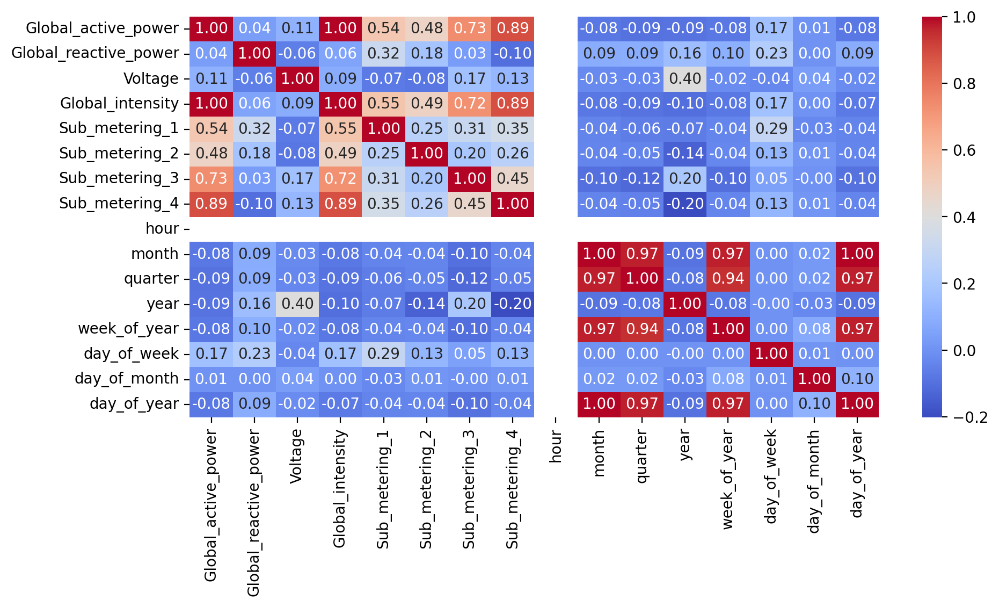

In [51]:
# Plot the visualization, distribution and correlation of Daily resampled data
df_visu_dist_corr(df8, "D", "Daily")

In [52]:
# Remove highly co-related columns
df8 = df8.drop(['Global_intensity','Sub_metering_3','Sub_metering_4'], axis=1)
df8

,Global_active_power,Global_reactive_power,Voltage,Sub_metering_1,Sub_metering_2,hour,month,quarter,year,week_of_year,day_of_week,day_of_month,day_of_year
date_time,,,,,,,,,,,,,
2006-12-16,3.053475,0.088187,236.243763,0.000000,1.378788,0,12,4,2006,50,5,16,350
2006-12-17,2.354486,0.156949,240.087028,1.411806,2.907639,0,12,4,2006,50,6,17,351
2006-12-18,1.530435,0.112356,241.231694,0.738194,1.820139,0,12,4,2006,51,0,18,352
2006-12-19,1.157079,0.104821,241.999313,0.582639,5.279167,0,12,4,2006,51,1,19,353
2006-12-20,1.545658,0.111804,242.308062,0.000000,1.838889,0,12,4,2006,51,2,20,354
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-11-22,1.417733,0.098857,240.197118,3.371528,1.465278,0,11,4,2010,47,0,22,326
2010-11-23,1.095511,0.095451,240.575528,1.299306,0.318056,0,11,4,2010,47,1,23,327
2010-11-24,1.247394,0.091986,240.030965,0.761111,1.977778,0,11,4,2010,47,2,24,328


## Data Normalization

In [53]:
# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))

# Scale the data
scaled_df8 = scaler.fit_transform(df8)

# Shape of scaled data
scaled_df8

array([[0.91678642, 0.13073198, 0.3153853 , ..., 0.83333333, 0.5       ,
        0.95616438],
       [0.6942518 , 0.42667057, 0.55049373, ..., 1.        , 0.53333333,
        0.95890411],
       [0.43190139, 0.23474981, 0.62051772, ..., 0.        , 0.56666667,
        0.96164384],
       ...,
       [0.34179083, 0.14708326, 0.54706415, ..., 0.33333333, 0.76666667,
        0.89589041],
       [0.26107518, 0.0982707 , 0.63914907, ..., 0.5       , 0.8       ,
        0.89863014],
       [0.31977106, 0.16292032, 0.56297334, ..., 0.66666667, 0.83333333,
        0.90136986]])

## LSTM-1 Adam(lr=0.001) seq=7 epochs=50 batch_size=32

(1148, 7, 13) (1148,) (287, 7, 13) (287,)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_7 (LSTM)                        │ (None, 100)                 │          45,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 45,701 (178.52 KB)

 Trainable params: 45,701 (178.52 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
36/36 - 1s - 41ms/step - loss: 0.0402 - val_loss: 0.0074
Epoch 2/50
36/36 - 0s - 12ms/step - loss: 0.0188 - val_loss: 0.0066
Epoch 3/50
36/36 - 0s - 5ms/step - loss: 0.0165 - val_loss: 0.0062
Epoch 4/50
36/36 - 0s - 5ms/step - loss: 0.0184 - val_loss: 0.0081
Epoch 5/50
36/36 - 0s - 5ms/step - loss: 0.0169 - val_loss: 0.0058
Epoch 6/50
36/36 - 0s - 8ms/step - loss: 0.0141 - val_loss: 0.0060
Epoch 7/50
36/36 - 0s - 5ms/step - loss: 0.0139 - val_loss: 0.0063
Epoch 8/50
36/36 - 0s - 8ms/step - loss: 0.0134 - val_loss: 0.0057
Epoch 9/50
36/36 - 0s - 5ms/step - loss: 0.0129 - val_loss: 0.0057
Epoch 10/50
36/36 - 0s - 5ms/step - loss: 0.0128 - val_loss: 0.0058
Epoch 11/50
36/36 - 0s - 8ms/step - loss: 0.0125 - val_loss: 0.0056
Epoch 12/50
36/36 - 0s - 5ms/step - loss: 0.0124 - val_loss: 0.0057
Epoch 13/50
36/36 - 0s - 5ms/step - loss: 0.0121 - val_loss: 0.0059
Epoch 14/50
36/36 - 0s - 5ms/step - loss: 0.0116 - val_loss: 0.0056
Epoch 15/50
36/36 - 0s - 5ms/step - loss: 0.0115 - val_

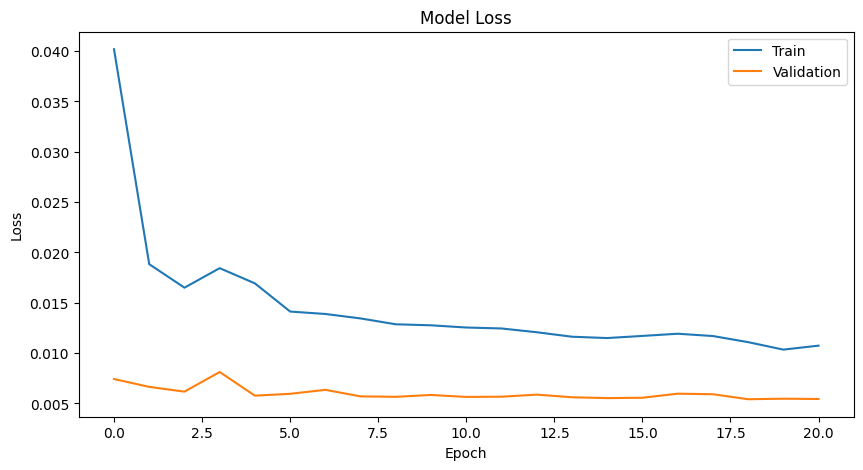

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

Train MAE: 0.233
Train MSE: 0.100
Train RMSE: 0.316
Train R² score: 0.469

Test MAE: 0.178
Test MSE: 0.054
Test RMSE: 0.232
Test R² score: 0.406


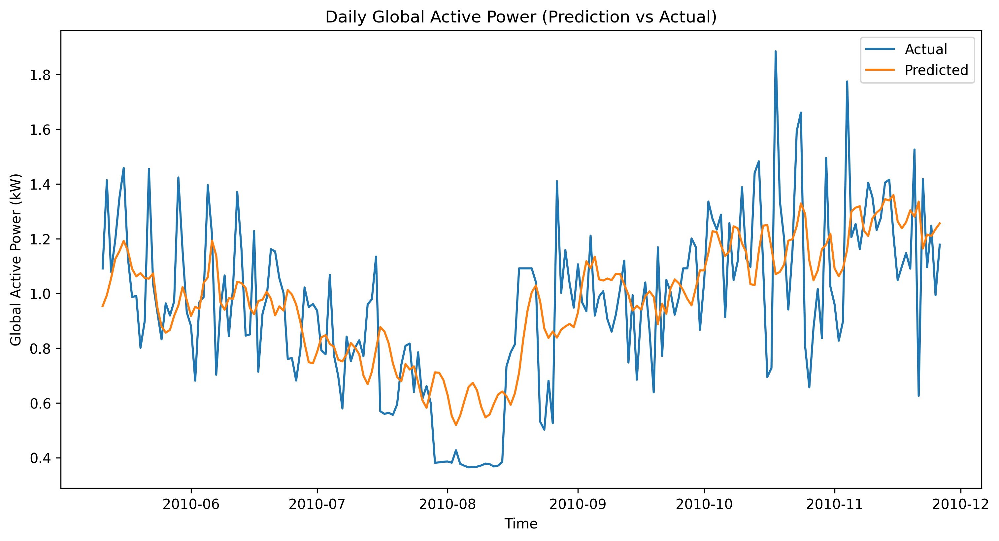

In [54]:
# Define sequence length and features
sequence_length = 7             # Number of time steps to consider in each sequence
num_features = len(df8.columns)  # Number of features

# Create sequences and corresponding labels
sequences = []
labels = []
for i in range(len(scaled_df8) - sequence_length):
    seq = scaled_df8[i:i+sequence_length]
    label = scaled_df8[i+sequence_length][0]  # 'Global_Active_Power' column index
    sequences.append(seq)
    labels.append(label)

# Convert to numpy arrays
sequences = np.array(sequences)
labels = np.array(labels)

# Split into train and test sets
train_size = int(0.8 * len(sequences))
X_train, X_test = sequences[:train_size], sequences[train_size:]
y_train, y_test = labels[:train_size], labels[train_size:]

# Check the shape of Train & Test Split
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Create the LSTM model
model = Sequential()
model.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(1))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Displaying a summary of the model
model.summary()

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=20 , min_delta=0.005)

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test),
                    verbose=2, shuffle=False, callbacks=[early_stopping])

# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Predict train and test data using the trained model
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Perform inverse transformation to rescale back to original range
# y_true values for train data
y_train_copies = np.repeat(y_train.reshape(-1, 1), X_train.shape[-1], axis=-1)
true_y_train = scaler.inverse_transform(y_train_copies)[:,0]

# predicted values for train data
train_prediction_copies = np.repeat(train_predict, df8.shape[-1], axis=-1)
pred_y_train = scaler.inverse_transform(train_prediction_copies)[:,0]

# y_true values for test data
y_test_copies = np.repeat(y_test.reshape(-1, 1), X_test.shape[-1], axis=-1)
true_y_test = scaler.inverse_transform(y_test_copies)[:,0]

# predicted values for test data
test_prediction_copies = np.repeat(test_predict, df8.shape[-1], axis=-1)
pred_y_test = scaler.inverse_transform(test_prediction_copies)[:,0]

# Calculate evaluation metrics
print(f'\nTrain MAE: {mean_absolute_error(true_y_train, pred_y_train):.3f}')
print(f'Train MSE: {mean_squared_error(true_y_train, pred_y_train):.3f}')
print(f'Train RMSE: {np.sqrt(mean_squared_error(true_y_train, pred_y_train)):.3f}')
print(f'Train R² score: {r2_score(true_y_train, pred_y_train):.3f}')

print(f'\nTest MAE: {mean_absolute_error(true_y_test, pred_y_test):.3f}')
print(f'Test MSE: {mean_squared_error(true_y_test, pred_y_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(true_y_test, pred_y_test)):.3f}')
print(f'Test R² score: {r2_score(true_y_test, pred_y_test):.3f}')

# Plotting predicted and actual temperatures
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df8.index[-200:], true_y_test[-200:], label='Actual')
plt.plot(df8.index[-200:], pred_y_test[-200:], label='Predicted')
plt.title('Daily Global Active Power (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.show()